# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

C:\Users\Tadas\Anaconda3\envs\deeplearning\lib\site-packages\tensorflow\python\framework\dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\Tadas\Anaconda3\envs\deeplearning\lib\site-packages\tensorflow\python\framework\dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\Tadas\Anaconda3\envs\deeplearning\lib\site-packages\tensorflow\python\framework\dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\Tadas\Anaconda3\envs\deeplearning\lib\site-

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

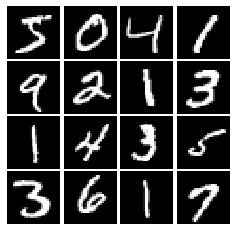

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [10]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.maximum(x*alpha, x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [11]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [14]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1, dtype=tf.dtypes.float32, seed=None, name=None)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [15]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [19]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(256, input_shape=(784,),use_bias=True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256, use_bias=True),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1, use_bias=True)
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [20]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [23]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.Dense(1024, input_shape=(noise_dim,),use_bias=True, activation='relu'),
        tf.keras.layers.Dense(1024, use_bias=True, activation='relu'),
        tf.keras.layers.Dense(784, use_bias=True, activation='tanh')
        

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [24]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [34]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    real_labels = tf.ones_like(logits_real)
    fake_labels = tf.zeros_like(logits_fake)
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = bce(real_labels, logits_real)
    fake_loss = bce(fake_labels, logits_fake)
    loss = real_loss + fake_loss
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    labels = tf.ones_like(logits_fake)
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(labels, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [35]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [36]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [40]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1 = beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate=learning_rate, beta_1 = beta1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [41]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.904, G:0.773


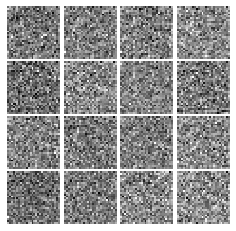

Epoch: 0, Iter: 20, D: 0.6126, G:0.9147


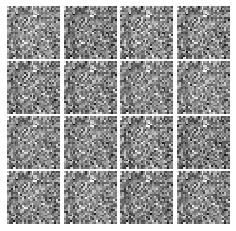

Epoch: 0, Iter: 40, D: 0.6855, G:1.23


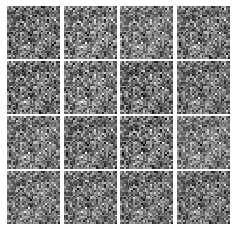

Epoch: 0, Iter: 60, D: 2.022, G:0.5827


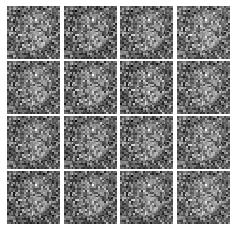

Epoch: 0, Iter: 80, D: 0.9137, G:1.675


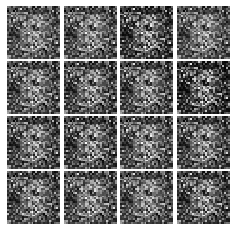

Epoch: 0, Iter: 100, D: 0.9165, G:1.9


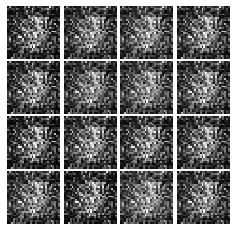

Epoch: 0, Iter: 120, D: 1.675, G:0.9989


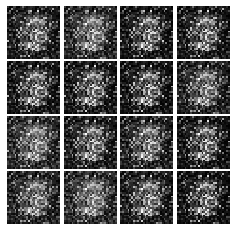

Epoch: 0, Iter: 140, D: 1.116, G:1.418


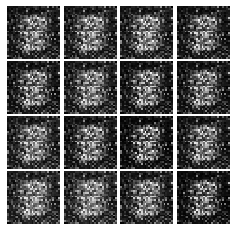

Epoch: 0, Iter: 160, D: 1.134, G:1.345


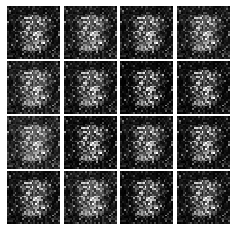

Epoch: 0, Iter: 180, D: 0.9945, G:1.455


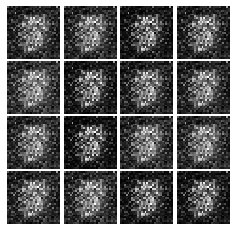

Epoch: 0, Iter: 200, D: 1.077, G:1.679


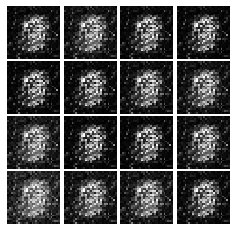

Epoch: 0, Iter: 220, D: 1.225, G:1.146


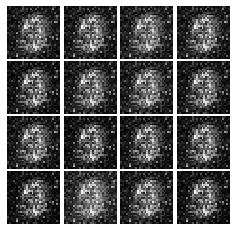

Epoch: 0, Iter: 240, D: 1.169, G:1.448


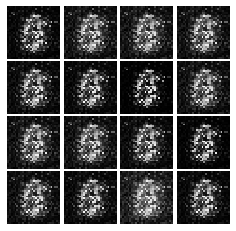

Epoch: 0, Iter: 260, D: 0.7263, G:1.759


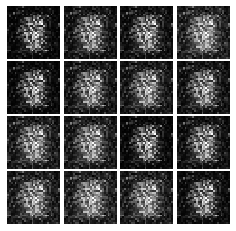

Epoch: 0, Iter: 280, D: 0.9193, G:1.871


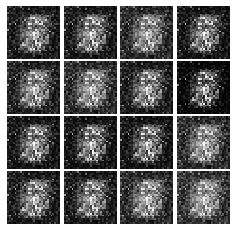

Epoch: 0, Iter: 300, D: 0.547, G:1.96


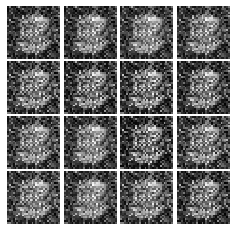

Epoch: 0, Iter: 320, D: 1.36, G:1.135


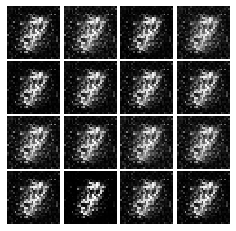

Epoch: 0, Iter: 340, D: 0.8031, G:1.617


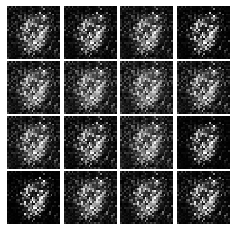

Epoch: 0, Iter: 360, D: 1.293, G:3.869


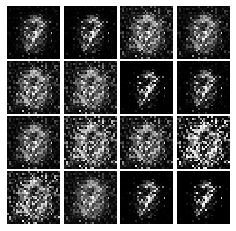

Epoch: 0, Iter: 380, D: 0.6887, G:1.622


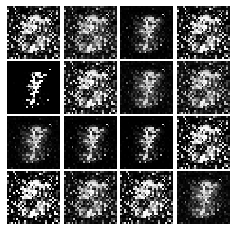

Epoch: 0, Iter: 400, D: 1.249, G:2.123


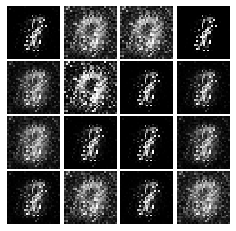

Epoch: 0, Iter: 420, D: 0.7348, G:1.518


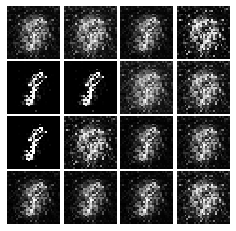

Epoch: 0, Iter: 440, D: 0.9165, G:1.468


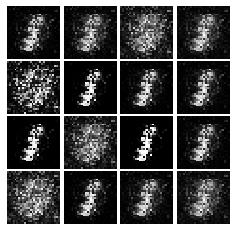

Epoch: 0, Iter: 460, D: 0.8523, G:3.062


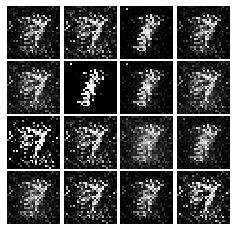

Epoch: 1, Iter: 480, D: 1.124, G:1.359


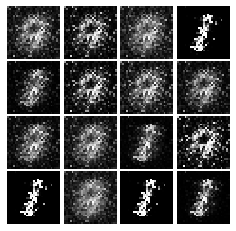

Epoch: 1, Iter: 500, D: 0.9446, G:1.835


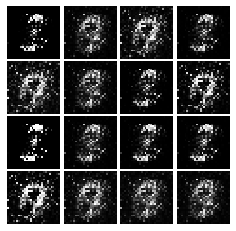

Epoch: 1, Iter: 520, D: 0.8223, G:5.081


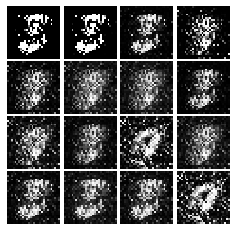

Epoch: 1, Iter: 540, D: 1.034, G:2.956


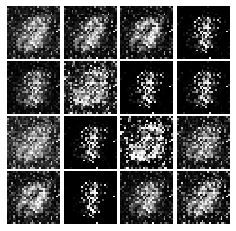

Epoch: 1, Iter: 560, D: 0.9384, G:1.921


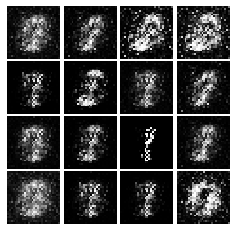

Epoch: 1, Iter: 580, D: 1.309, G:1.219


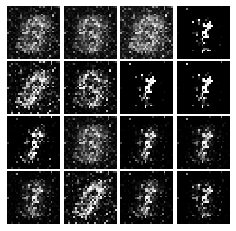

Epoch: 1, Iter: 600, D: 1.233, G:1.145


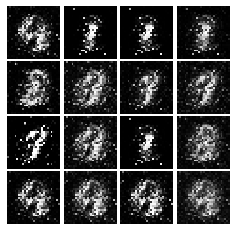

Epoch: 1, Iter: 620, D: 1.064, G:1.127


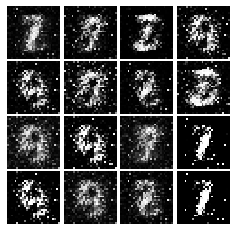

Epoch: 1, Iter: 640, D: 1.126, G:1.188


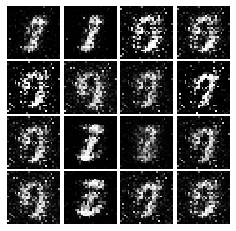

Epoch: 1, Iter: 660, D: 1.107, G:1.378


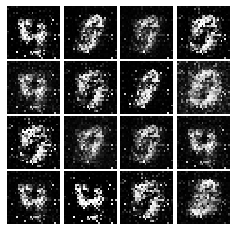

Epoch: 1, Iter: 680, D: 1.554, G:2.382


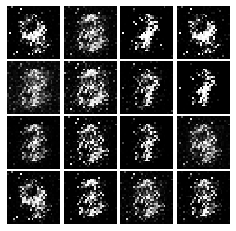

Epoch: 1, Iter: 700, D: 1.125, G:1.022


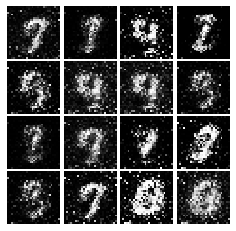

Epoch: 1, Iter: 720, D: 1.046, G:1.094


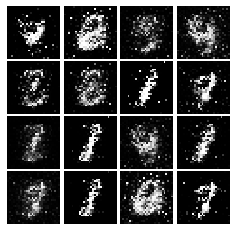

Epoch: 1, Iter: 740, D: 1.131, G:1.179


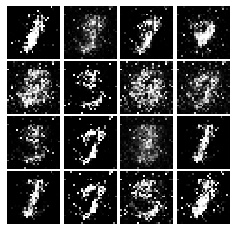

Epoch: 1, Iter: 760, D: 1.281, G:0.6617


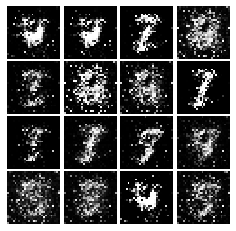

Epoch: 1, Iter: 780, D: 1.243, G:2.073


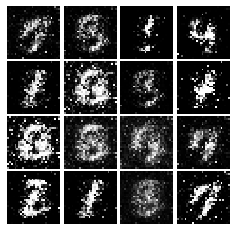

Epoch: 1, Iter: 800, D: 0.9618, G:1.275


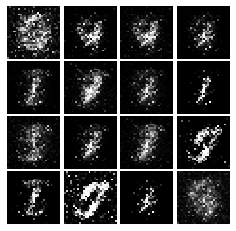

Epoch: 1, Iter: 820, D: 0.9665, G:2.589


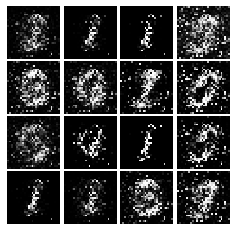

Epoch: 1, Iter: 840, D: 1.355, G:0.7488


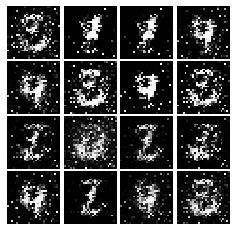

Epoch: 1, Iter: 860, D: 1.07, G:1.702


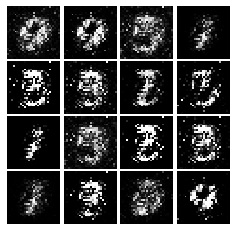

Epoch: 1, Iter: 880, D: 1.168, G:1.171


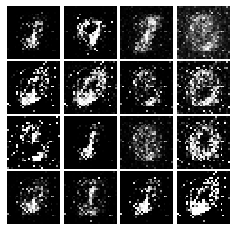

Epoch: 1, Iter: 900, D: 1.129, G:1.527


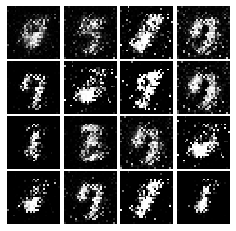

Epoch: 1, Iter: 920, D: 1.413, G:0.9258


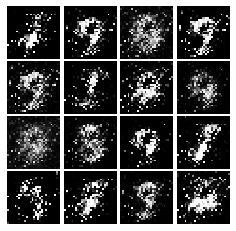

Epoch: 2, Iter: 940, D: 1.066, G:3.231


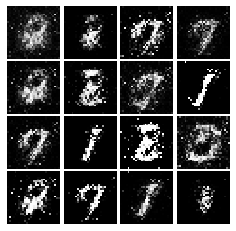

Epoch: 2, Iter: 960, D: 1.167, G:1.248


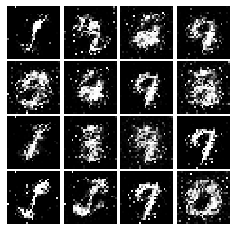

Epoch: 2, Iter: 980, D: 1.153, G:1.148


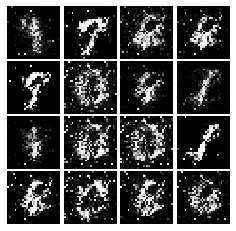

Epoch: 2, Iter: 1000, D: 1.149, G:1.157


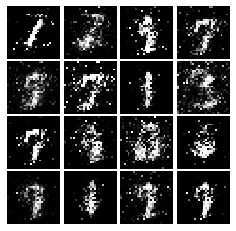

Epoch: 2, Iter: 1020, D: 1.162, G:1.678


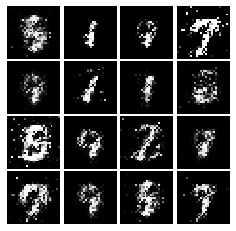

Epoch: 2, Iter: 1040, D: 1.162, G:1.455


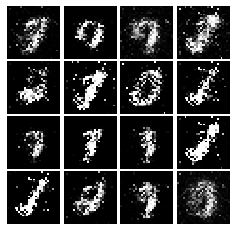

Epoch: 2, Iter: 1060, D: 1.042, G:1.212


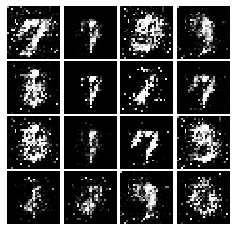

Epoch: 2, Iter: 1080, D: 0.8685, G:1.601


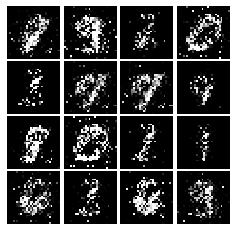

Epoch: 2, Iter: 1100, D: 1.293, G:1.556


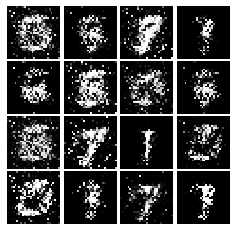

Epoch: 2, Iter: 1120, D: 0.9745, G:2.474


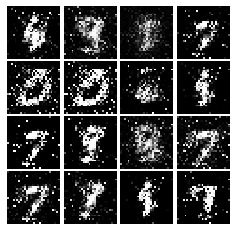

Epoch: 2, Iter: 1140, D: 1.372, G:1.625


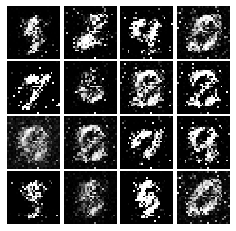

Epoch: 2, Iter: 1160, D: 1.005, G:1.14


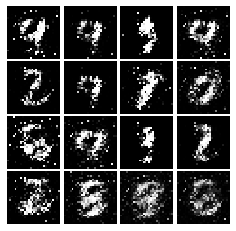

Epoch: 2, Iter: 1180, D: 1.117, G:1.072


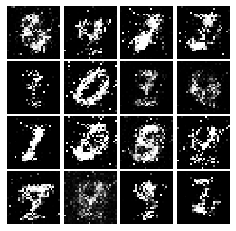

Epoch: 2, Iter: 1200, D: 1.146, G:1.056


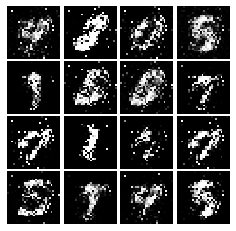

Epoch: 2, Iter: 1220, D: 0.9842, G:1.214


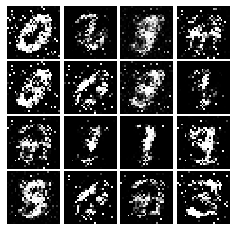

Epoch: 2, Iter: 1240, D: 1.097, G:1.261


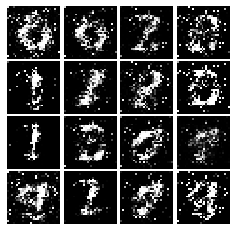

Epoch: 2, Iter: 1260, D: 1.163, G:1.449


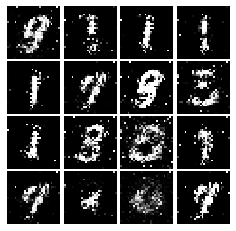

Epoch: 2, Iter: 1280, D: 1.166, G:1.196


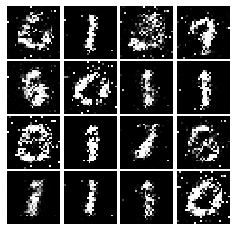

Epoch: 2, Iter: 1300, D: 1.12, G:1.074


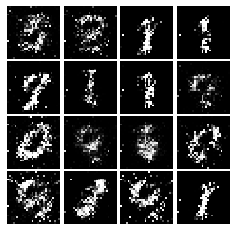

Epoch: 2, Iter: 1320, D: 1.473, G:1.886


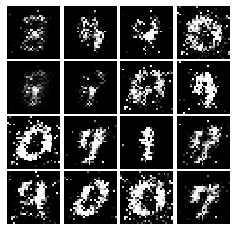

Epoch: 2, Iter: 1340, D: 1.421, G:0.2744


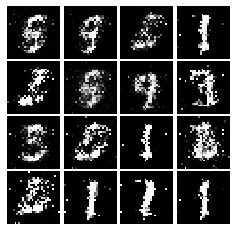

Epoch: 2, Iter: 1360, D: 1.195, G:1.109


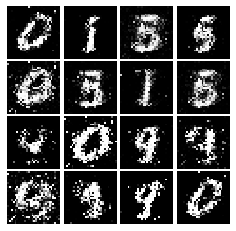

Epoch: 2, Iter: 1380, D: 1.314, G:1.134


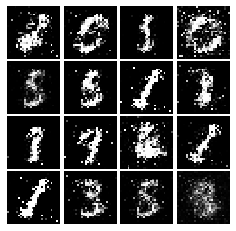

Epoch: 2, Iter: 1400, D: 1.239, G:1.757


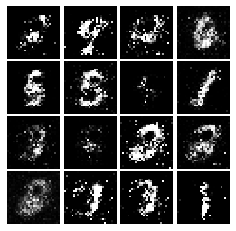

Epoch: 3, Iter: 1420, D: 1.233, G:0.9213


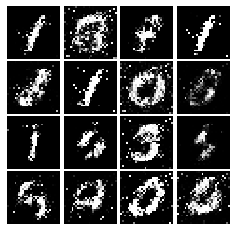

Epoch: 3, Iter: 1440, D: 1.393, G:0.6705


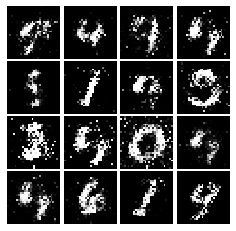

Epoch: 3, Iter: 1460, D: 1.291, G:0.8539


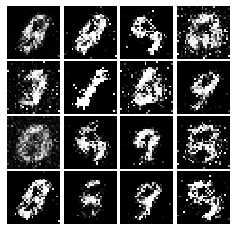

Epoch: 3, Iter: 1480, D: 1.334, G:0.8675


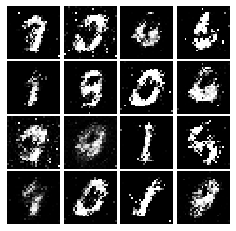

Epoch: 3, Iter: 1500, D: 1.339, G:0.811


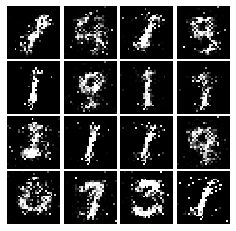

Epoch: 3, Iter: 1520, D: 1.191, G:2.188


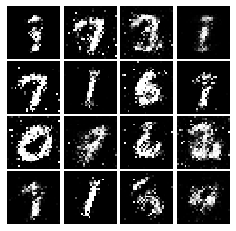

Epoch: 3, Iter: 1540, D: 1.255, G:0.9175


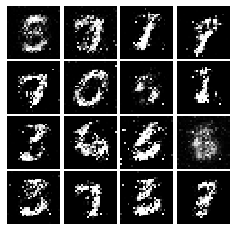

Epoch: 3, Iter: 1560, D: 1.225, G:0.9161


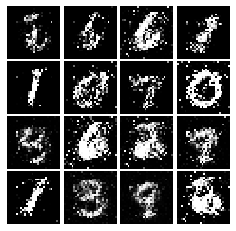

Epoch: 3, Iter: 1580, D: 1.305, G:0.8621


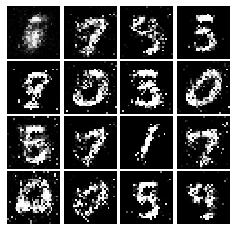

Epoch: 3, Iter: 1600, D: 1.225, G:0.8483


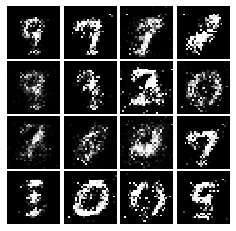

Epoch: 3, Iter: 1620, D: 1.146, G:1.119


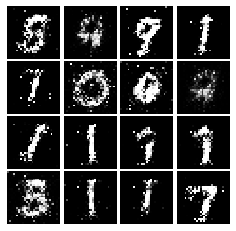

Epoch: 3, Iter: 1640, D: 1.303, G:1.0


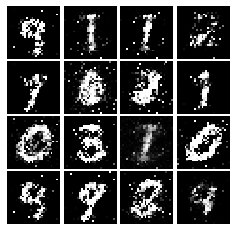

Epoch: 3, Iter: 1660, D: 1.153, G:1.228


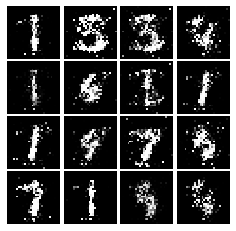

Epoch: 3, Iter: 1680, D: 1.249, G:0.9859


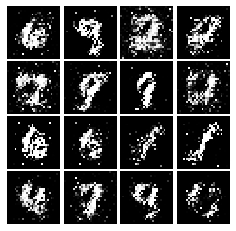

Epoch: 3, Iter: 1700, D: 1.324, G:1.081


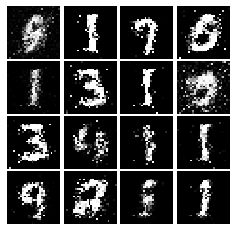

Epoch: 3, Iter: 1720, D: 1.252, G:0.7153


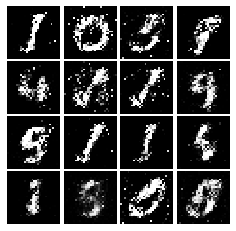

Epoch: 3, Iter: 1740, D: 1.213, G:0.8696


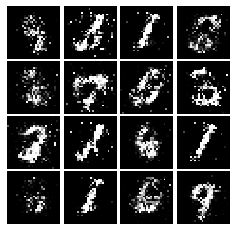

Epoch: 3, Iter: 1760, D: 1.169, G:0.9996


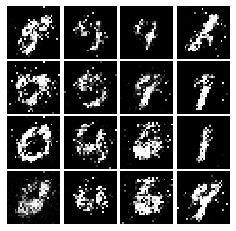

Epoch: 3, Iter: 1780, D: 1.255, G:0.88


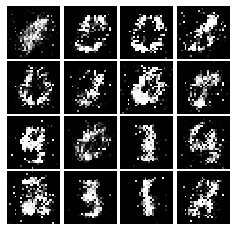

Epoch: 3, Iter: 1800, D: 1.181, G:0.9154


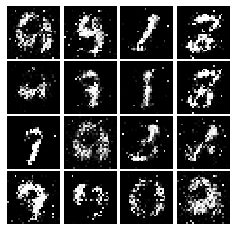

Epoch: 3, Iter: 1820, D: 1.319, G:0.8621


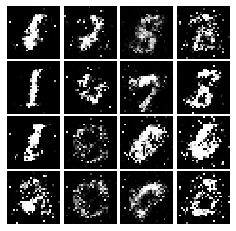

Epoch: 3, Iter: 1840, D: 1.241, G:0.9124


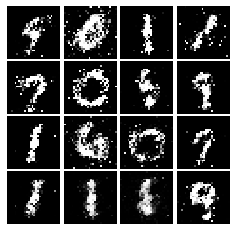

Epoch: 3, Iter: 1860, D: 1.327, G:1.07


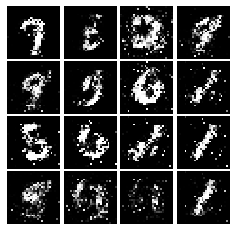

Epoch: 4, Iter: 1880, D: 1.179, G:1.047


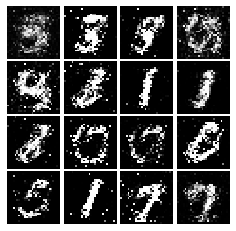

Epoch: 4, Iter: 1900, D: 1.243, G:0.9942


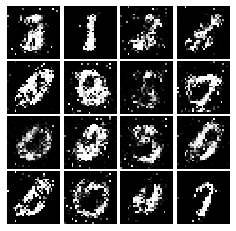

Epoch: 4, Iter: 1920, D: 1.284, G:0.9558


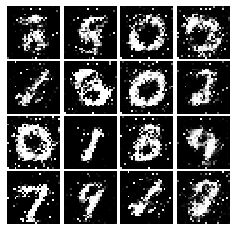

Epoch: 4, Iter: 1940, D: 1.388, G:0.8304


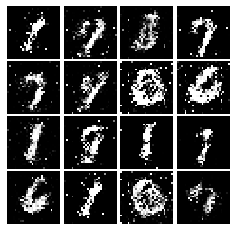

Epoch: 4, Iter: 1960, D: 1.19, G:0.9611


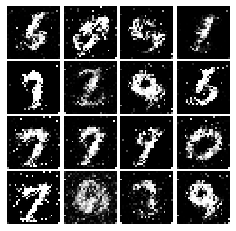

Epoch: 4, Iter: 1980, D: 1.31, G:0.9705


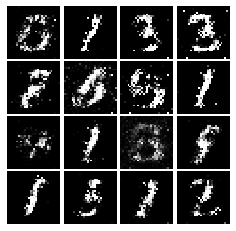

Epoch: 4, Iter: 2000, D: 1.41, G:0.9832


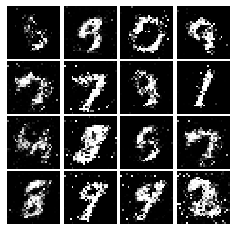

Epoch: 4, Iter: 2020, D: 1.333, G:0.8477


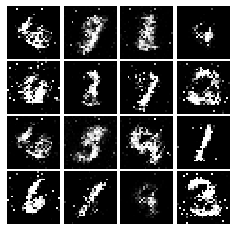

Epoch: 4, Iter: 2040, D: 1.277, G:0.7774


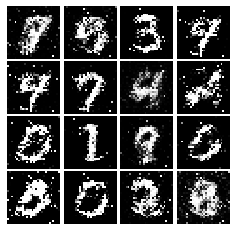

Epoch: 4, Iter: 2060, D: 1.272, G:0.9664


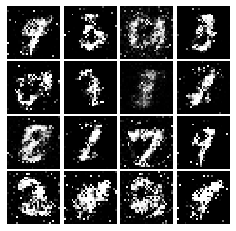

Epoch: 4, Iter: 2080, D: 1.349, G:0.91


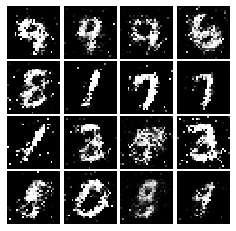

Epoch: 4, Iter: 2100, D: 1.299, G:0.8199


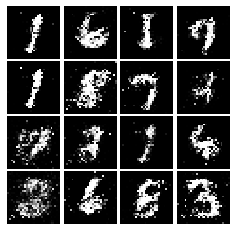

Epoch: 4, Iter: 2120, D: 1.192, G:1.159


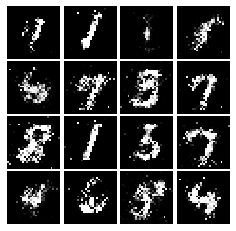

Epoch: 4, Iter: 2140, D: 1.369, G:0.7954


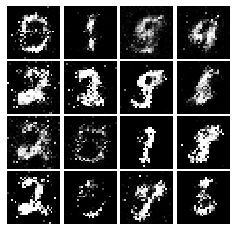

Epoch: 4, Iter: 2160, D: 1.346, G:0.9569


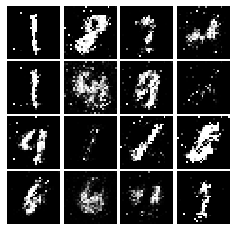

Epoch: 4, Iter: 2180, D: 1.285, G:0.8593


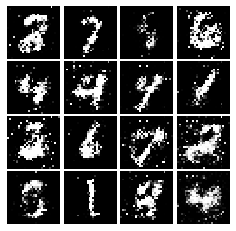

Epoch: 4, Iter: 2200, D: 1.292, G:0.7381


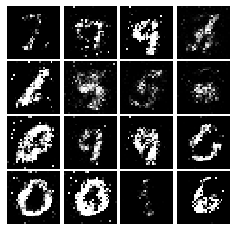

Epoch: 4, Iter: 2220, D: 1.364, G:0.8805


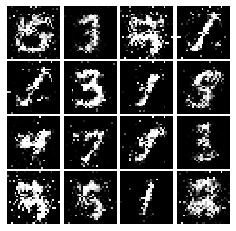

Epoch: 4, Iter: 2240, D: 1.333, G:0.8059


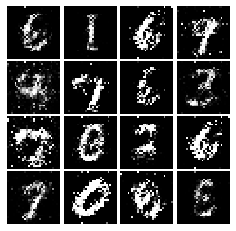

Epoch: 4, Iter: 2260, D: 1.358, G:0.8321


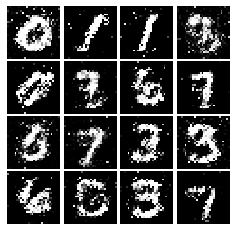

Epoch: 4, Iter: 2280, D: 1.375, G:0.8147


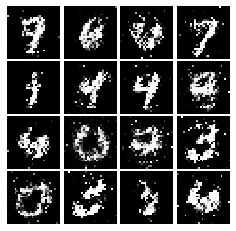

Epoch: 4, Iter: 2300, D: 1.3, G:0.8116


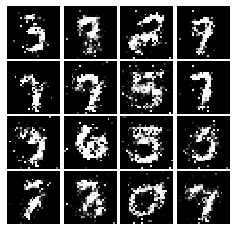

Epoch: 4, Iter: 2320, D: 1.307, G:0.775


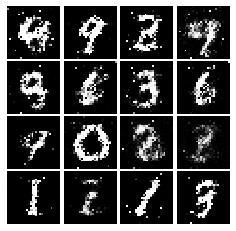

Epoch: 4, Iter: 2340, D: 1.264, G:0.8845


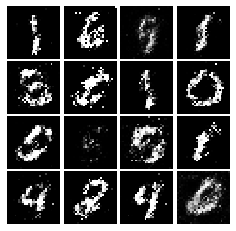

Epoch: 5, Iter: 2360, D: 1.232, G:0.8192


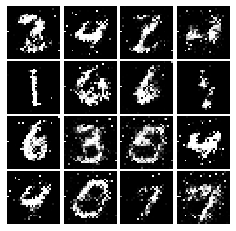

Epoch: 5, Iter: 2380, D: 1.309, G:0.8182


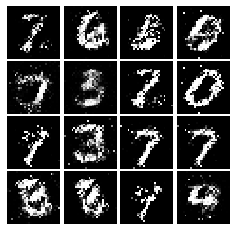

Epoch: 5, Iter: 2400, D: 1.367, G:0.8867


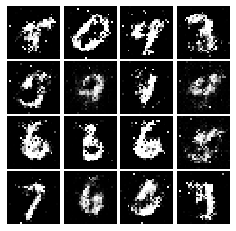

Epoch: 5, Iter: 2420, D: 1.335, G:0.9034


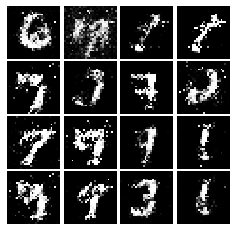

Epoch: 5, Iter: 2440, D: 1.327, G:0.8655


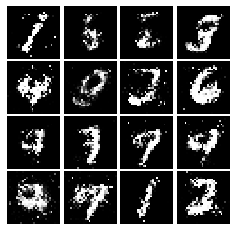

Epoch: 5, Iter: 2460, D: 1.327, G:0.831


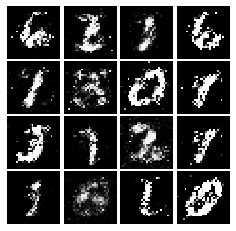

Epoch: 5, Iter: 2480, D: 1.38, G:0.9999


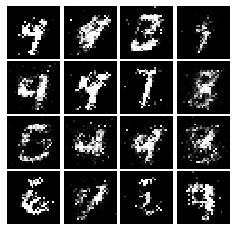

Epoch: 5, Iter: 2500, D: 1.184, G:0.9403


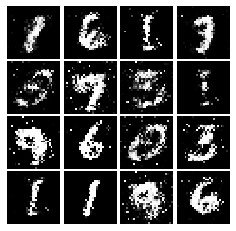

Epoch: 5, Iter: 2520, D: 1.395, G:0.8452


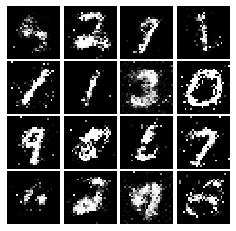

Epoch: 5, Iter: 2540, D: 1.305, G:0.7247


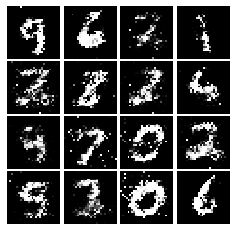

Epoch: 5, Iter: 2560, D: 1.333, G:0.8203


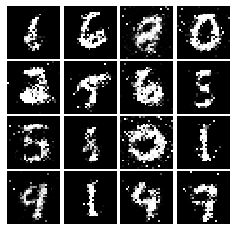

Epoch: 5, Iter: 2580, D: 1.257, G:0.8272


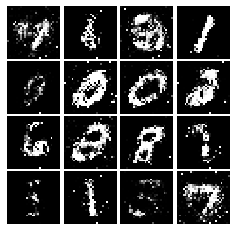

Epoch: 5, Iter: 2600, D: 1.446, G:0.682


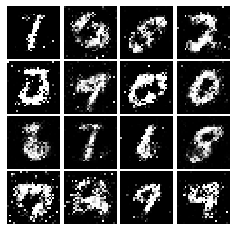

Epoch: 5, Iter: 2620, D: 1.284, G:0.8338


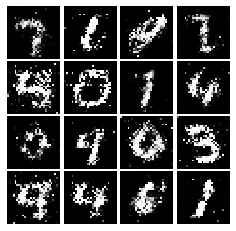

Epoch: 5, Iter: 2640, D: 1.3, G:0.8447


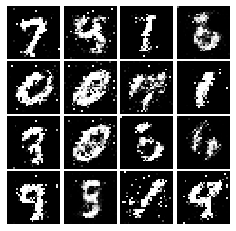

Epoch: 5, Iter: 2660, D: 1.305, G:0.9137


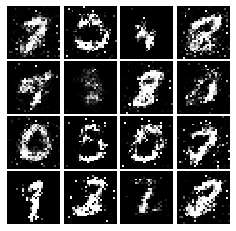

Epoch: 5, Iter: 2680, D: 1.53, G:0.8677


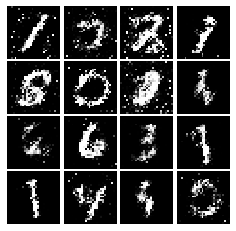

Epoch: 5, Iter: 2700, D: 1.45, G:0.6864


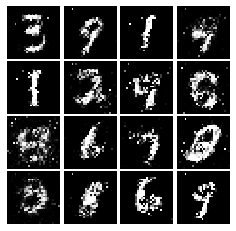

Epoch: 5, Iter: 2720, D: 1.307, G:0.776


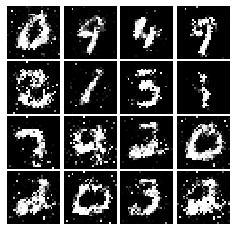

Epoch: 5, Iter: 2740, D: 1.309, G:0.853


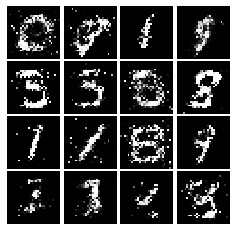

Epoch: 5, Iter: 2760, D: 1.317, G:0.7914


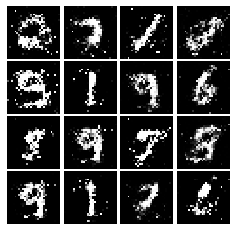

Epoch: 5, Iter: 2780, D: 1.198, G:0.9633


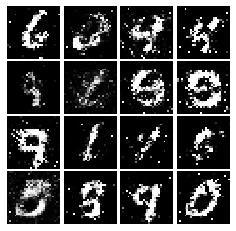

Epoch: 5, Iter: 2800, D: 1.232, G:0.9093


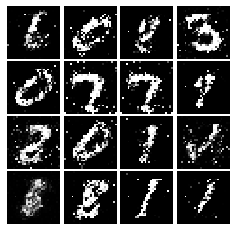

Epoch: 6, Iter: 2820, D: 1.363, G:0.6925


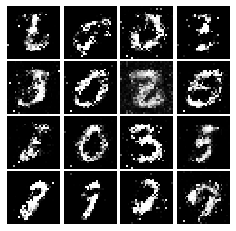

Epoch: 6, Iter: 2840, D: 1.257, G:0.937


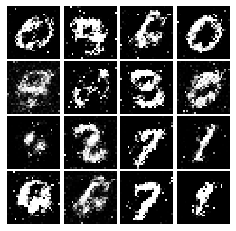

Epoch: 6, Iter: 2860, D: 1.332, G:0.8636


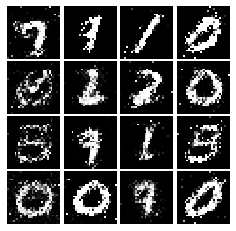

Epoch: 6, Iter: 2880, D: 1.243, G:0.867


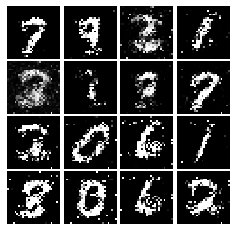

Epoch: 6, Iter: 2900, D: 1.27, G:0.8242


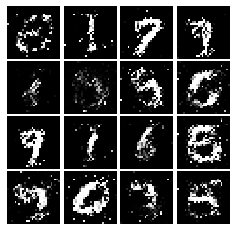

Epoch: 6, Iter: 2920, D: 1.343, G:0.7867


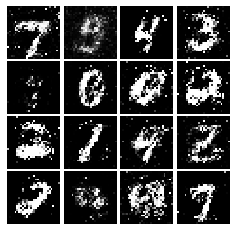

Epoch: 6, Iter: 2940, D: 1.379, G:0.8506


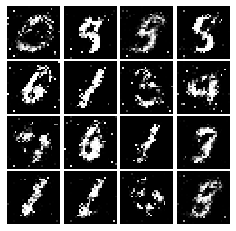

Epoch: 6, Iter: 2960, D: 1.355, G:0.7332


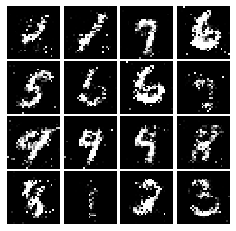

Epoch: 6, Iter: 2980, D: 1.325, G:0.8035


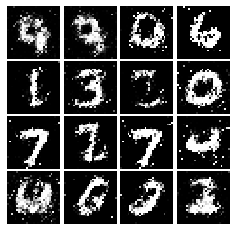

Epoch: 6, Iter: 3000, D: 1.385, G:0.8278


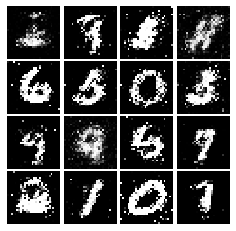

Epoch: 6, Iter: 3020, D: 1.239, G:0.9994


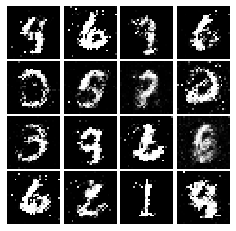

Epoch: 6, Iter: 3040, D: 1.37, G:0.8881


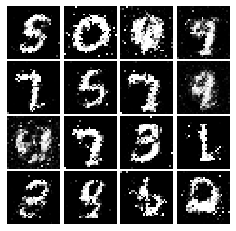

Epoch: 6, Iter: 3060, D: 1.35, G:0.8093


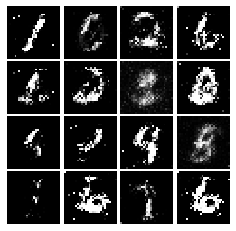

Epoch: 6, Iter: 3080, D: 1.244, G:0.806


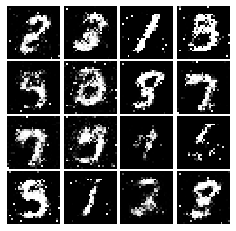

Epoch: 6, Iter: 3100, D: 1.205, G:0.8823


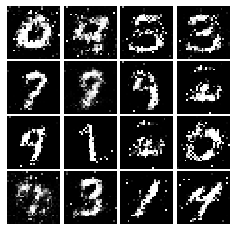

Epoch: 6, Iter: 3120, D: 1.295, G:0.8858


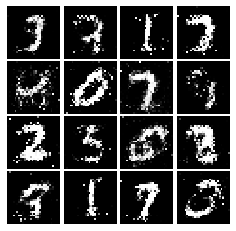

Epoch: 6, Iter: 3140, D: 1.335, G:0.8087


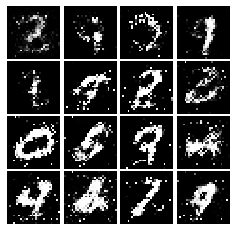

Epoch: 6, Iter: 3160, D: 1.262, G:0.8107


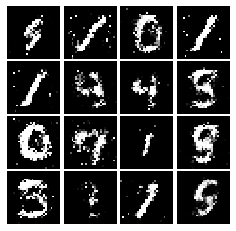

Epoch: 6, Iter: 3180, D: 1.261, G:0.8394


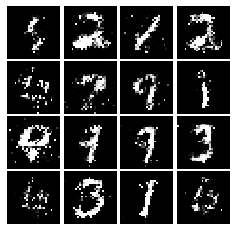

Epoch: 6, Iter: 3200, D: 1.227, G:0.874


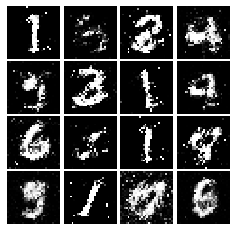

Epoch: 6, Iter: 3220, D: 1.309, G:0.8025


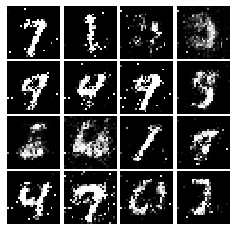

Epoch: 6, Iter: 3240, D: 1.323, G:0.7798


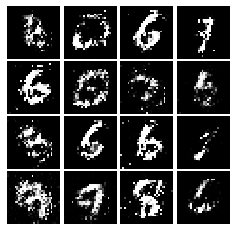

Epoch: 6, Iter: 3260, D: 1.294, G:0.8432


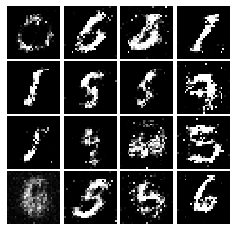

Epoch: 6, Iter: 3280, D: 1.285, G:0.888


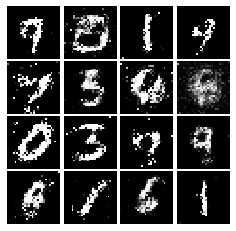

Epoch: 7, Iter: 3300, D: 1.346, G:0.8525


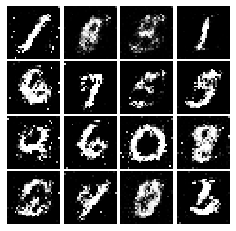

Epoch: 7, Iter: 3320, D: 1.34, G:0.8856


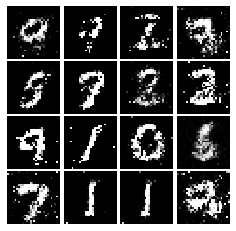

Epoch: 7, Iter: 3340, D: 1.309, G:1.033


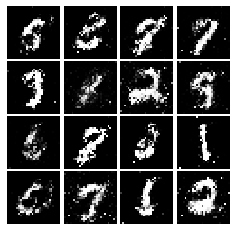

Epoch: 7, Iter: 3360, D: 1.345, G:0.8577


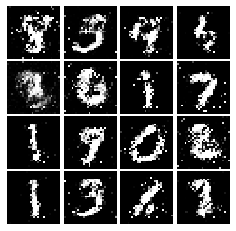

Epoch: 7, Iter: 3380, D: 1.338, G:0.9409


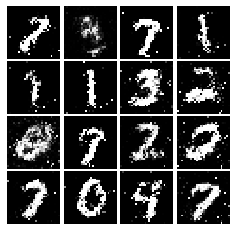

Epoch: 7, Iter: 3400, D: 1.398, G:0.8107


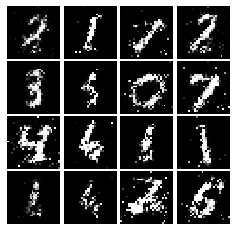

Epoch: 7, Iter: 3420, D: 1.341, G:0.7929


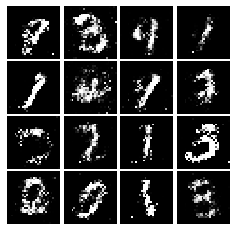

Epoch: 7, Iter: 3440, D: 1.319, G:0.8288


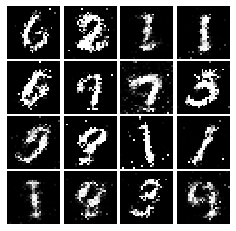

Epoch: 7, Iter: 3460, D: 1.357, G:0.826


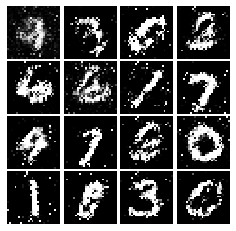

Epoch: 7, Iter: 3480, D: 1.394, G:0.6952


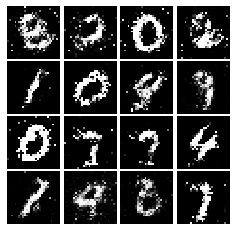

Epoch: 7, Iter: 3500, D: 1.314, G:0.8723


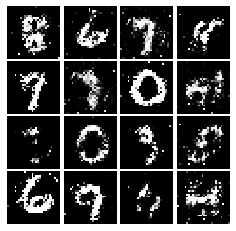

Epoch: 7, Iter: 3520, D: 1.389, G:0.898


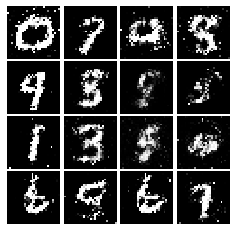

Epoch: 7, Iter: 3540, D: 1.254, G:0.7633


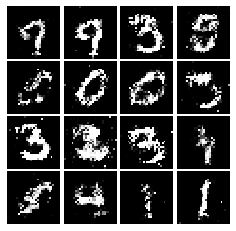

Epoch: 7, Iter: 3560, D: 1.311, G:0.7841


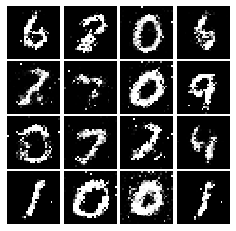

Epoch: 7, Iter: 3580, D: 1.402, G:0.8699


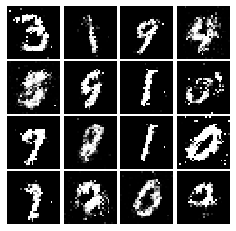

Epoch: 7, Iter: 3600, D: 1.334, G:0.7695


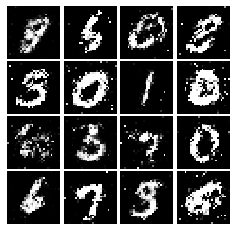

Epoch: 7, Iter: 3620, D: 1.295, G:0.7288


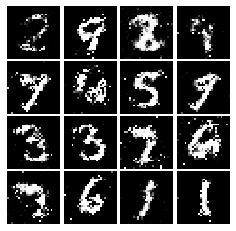

Epoch: 7, Iter: 3640, D: 1.383, G:0.7562


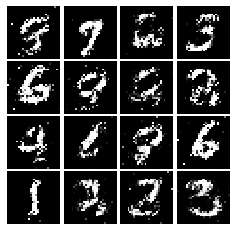

Epoch: 7, Iter: 3660, D: 1.318, G:0.7916


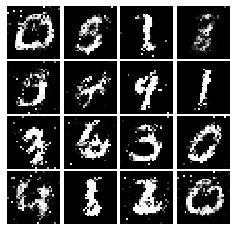

Epoch: 7, Iter: 3680, D: 1.237, G:0.925


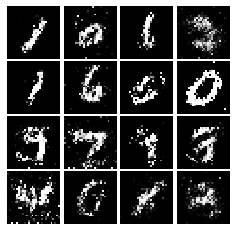

Epoch: 7, Iter: 3700, D: 1.352, G:0.812


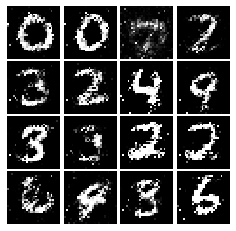

Epoch: 7, Iter: 3720, D: 1.305, G:0.8164


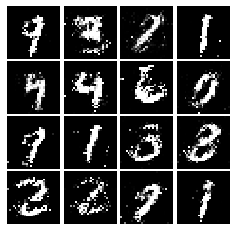

Epoch: 7, Iter: 3740, D: 1.341, G:0.8062


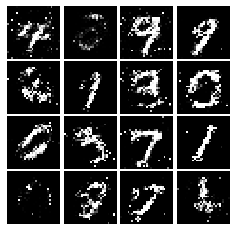

Epoch: 8, Iter: 3760, D: 1.384, G:0.89


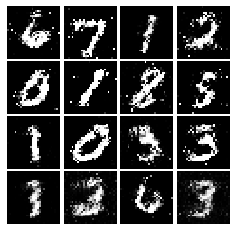

Epoch: 8, Iter: 3780, D: 1.277, G:0.8317


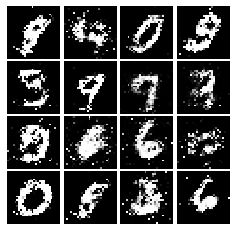

Epoch: 8, Iter: 3800, D: 1.269, G:0.7883


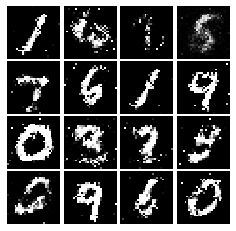

Epoch: 8, Iter: 3820, D: 1.354, G:0.745


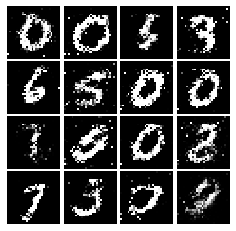

Epoch: 8, Iter: 3840, D: 1.35, G:0.7681


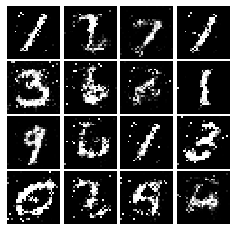

Epoch: 8, Iter: 3860, D: 1.272, G:0.7978


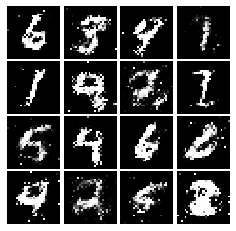

Epoch: 8, Iter: 3880, D: 1.34, G:0.7598


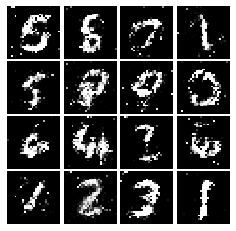

Epoch: 8, Iter: 3900, D: 1.304, G:0.7127


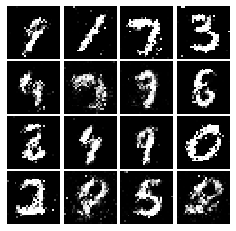

Epoch: 8, Iter: 3920, D: 1.345, G:0.7763


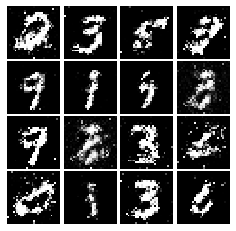

Epoch: 8, Iter: 3940, D: 1.323, G:0.7667


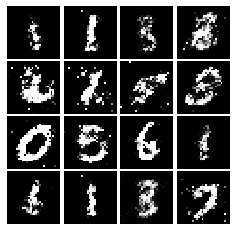

Epoch: 8, Iter: 3960, D: 1.315, G:0.7755


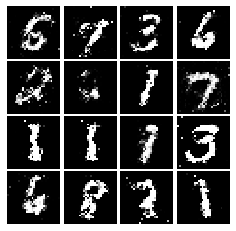

Epoch: 8, Iter: 3980, D: 1.356, G:0.8203


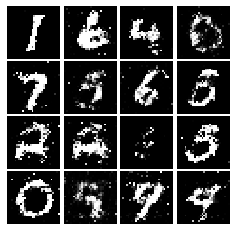

Epoch: 8, Iter: 4000, D: 1.329, G:0.8121


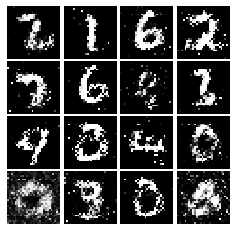

Epoch: 8, Iter: 4020, D: 1.353, G:0.7313


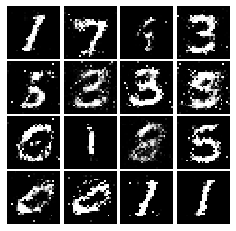

Epoch: 8, Iter: 4040, D: 1.439, G:0.7634


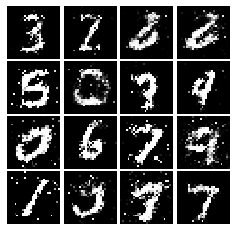

Epoch: 8, Iter: 4060, D: 1.28, G:0.9019


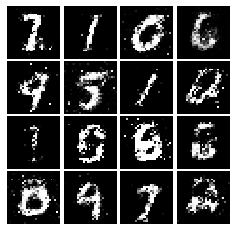

Epoch: 8, Iter: 4080, D: 1.368, G:0.8174


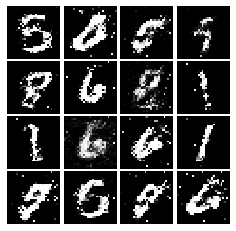

Epoch: 8, Iter: 4100, D: 1.39, G:0.8038


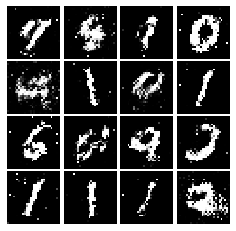

Epoch: 8, Iter: 4120, D: 1.322, G:0.8093


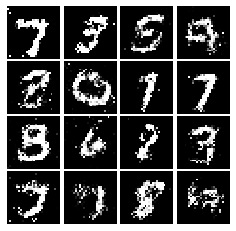

Epoch: 8, Iter: 4140, D: 1.379, G:0.819


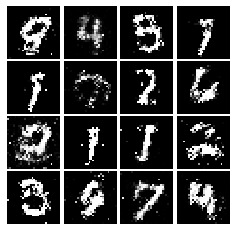

Epoch: 8, Iter: 4160, D: 1.349, G:0.8051


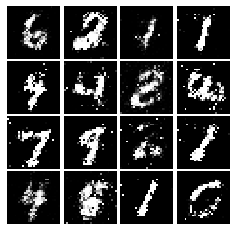

Epoch: 8, Iter: 4180, D: 1.391, G:0.906


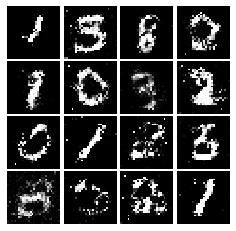

Epoch: 8, Iter: 4200, D: 1.383, G:0.7615


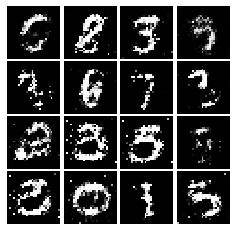

Epoch: 8, Iter: 4220, D: 1.328, G:0.8441


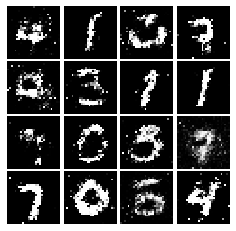

Epoch: 9, Iter: 4240, D: 1.382, G:0.7603


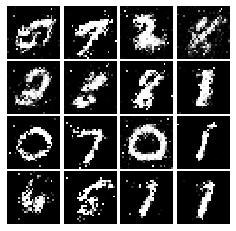

Epoch: 9, Iter: 4260, D: 1.353, G:0.8427


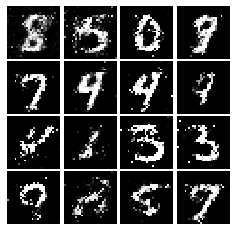

Epoch: 9, Iter: 4280, D: 1.49, G:0.9025


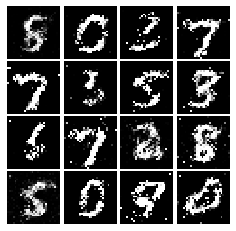

Epoch: 9, Iter: 4300, D: 1.395, G:0.7803


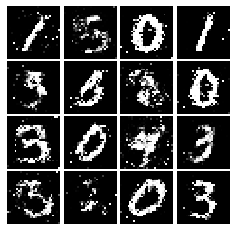

Epoch: 9, Iter: 4320, D: 1.343, G:0.7822


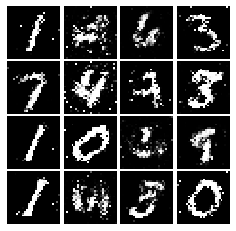

Epoch: 9, Iter: 4340, D: 1.371, G:0.8741


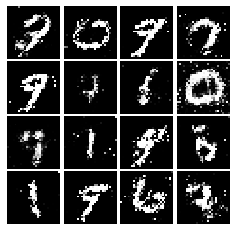

Epoch: 9, Iter: 4360, D: 1.348, G:0.9584


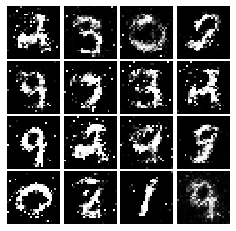

Epoch: 9, Iter: 4380, D: 1.436, G:0.8951


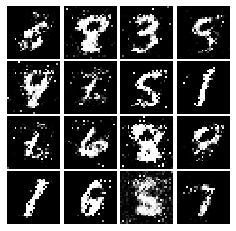

Epoch: 9, Iter: 4400, D: 1.327, G:0.7633


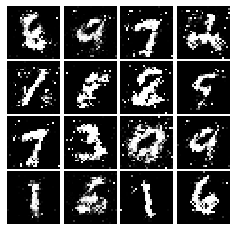

Epoch: 9, Iter: 4420, D: 1.283, G:0.7897


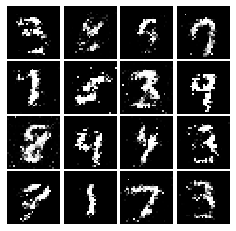

Epoch: 9, Iter: 4440, D: 1.388, G:0.8397


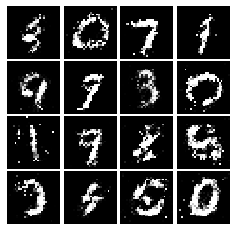

Epoch: 9, Iter: 4460, D: 1.32, G:0.8206


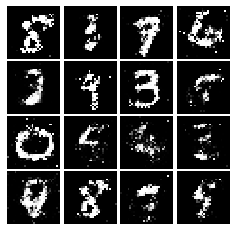

Epoch: 9, Iter: 4480, D: 1.349, G:0.8051


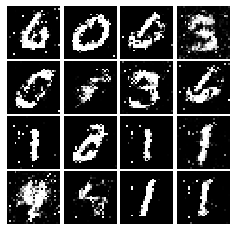

Epoch: 9, Iter: 4500, D: 1.303, G:0.9103


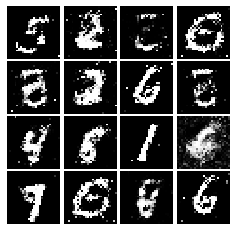

Epoch: 9, Iter: 4520, D: 1.36, G:0.7684


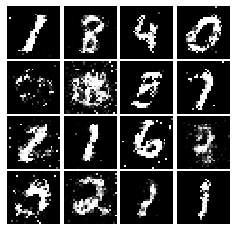

Epoch: 9, Iter: 4540, D: 1.429, G:0.7003


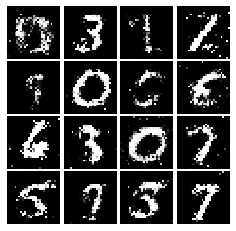

Epoch: 9, Iter: 4560, D: 1.32, G:0.7234


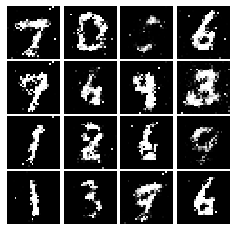

Epoch: 9, Iter: 4580, D: 1.382, G:0.8895


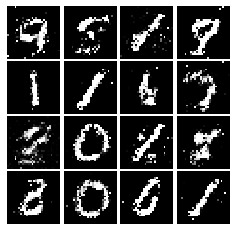

Epoch: 9, Iter: 4600, D: 1.343, G:0.9036


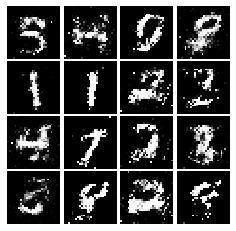

Epoch: 9, Iter: 4620, D: 1.34, G:0.7692


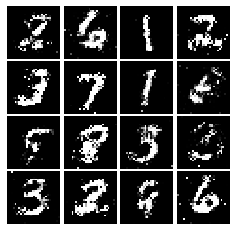

Epoch: 9, Iter: 4640, D: 1.283, G:0.8347


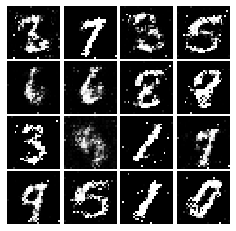

Epoch: 9, Iter: 4660, D: 1.258, G:0.8662


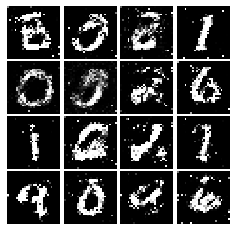

Epoch: 9, Iter: 4680, D: 1.395, G:0.9353


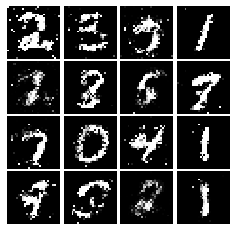

Final images


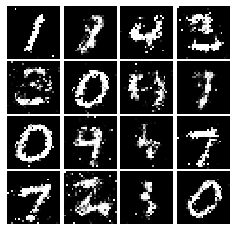

In [42]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [61]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

   
    loss = 0.5*(tf.reduce_mean(tf.square(scores_real-1))) + 0.5*(tf.reduce_mean(tf.square(scores_fake)))
    

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*(tf.reduce_mean(tf.square(scores_fake-1)))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [62]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.1492, G:0.3848


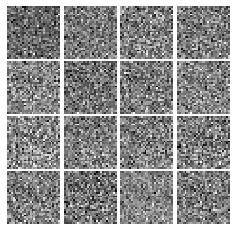

Epoch: 0, Iter: 20, D: 0.1756, G:1.425


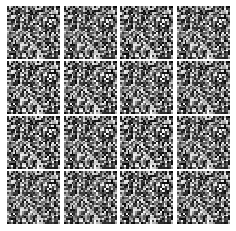

Epoch: 0, Iter: 40, D: 0.04475, G:0.8769


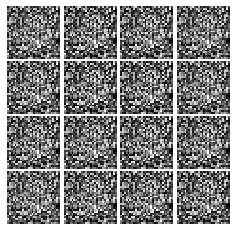

Epoch: 0, Iter: 60, D: 0.0478, G:0.6476


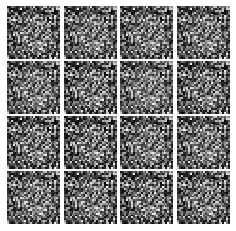

Epoch: 0, Iter: 80, D: 0.4003, G:1.626


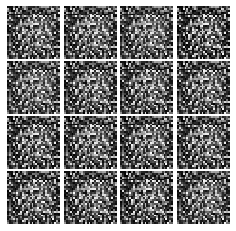

Epoch: 0, Iter: 100, D: 1.221, G:0.0317


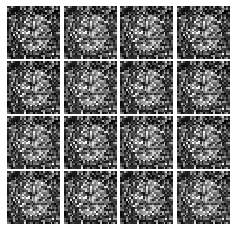

Epoch: 0, Iter: 120, D: 0.398, G:1.222


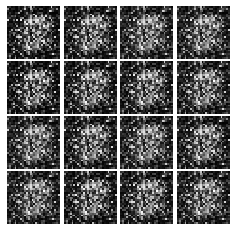

Epoch: 0, Iter: 140, D: 0.03726, G:0.5747


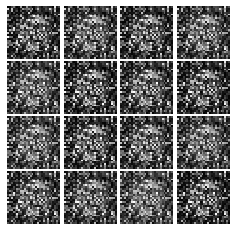

Epoch: 0, Iter: 160, D: 0.2531, G:0.07583


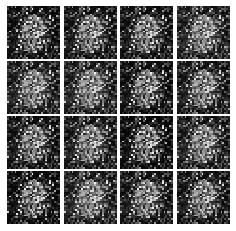

Epoch: 0, Iter: 180, D: 0.2087, G:0.2586


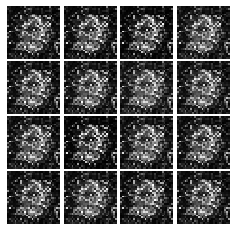

Epoch: 0, Iter: 200, D: 0.4628, G:0.2965


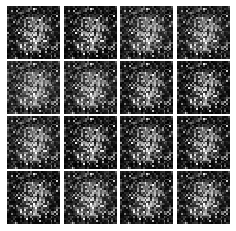

Epoch: 0, Iter: 220, D: 0.6286, G:1.297


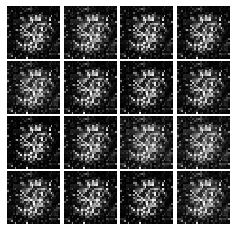

Epoch: 0, Iter: 240, D: 0.2758, G:0.123


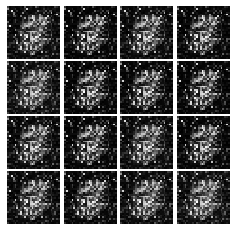

Epoch: 0, Iter: 260, D: 0.3879, G:0.1472


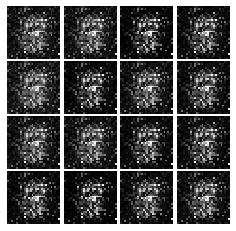

Epoch: 0, Iter: 280, D: 0.1292, G:0.346


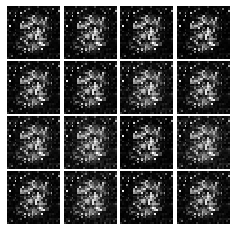

Epoch: 0, Iter: 300, D: 0.08632, G:0.7414


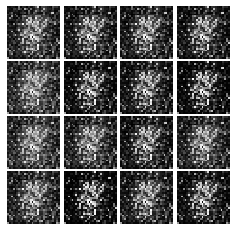

Epoch: 0, Iter: 320, D: 0.121, G:1.066


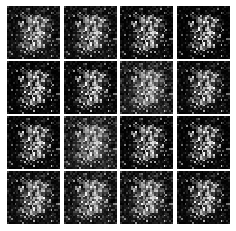

Epoch: 0, Iter: 340, D: 0.1299, G:0.7752


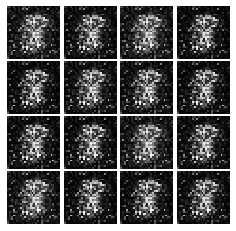

Epoch: 0, Iter: 360, D: 0.1608, G:0.8554


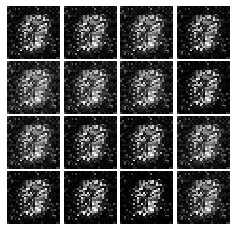

Epoch: 0, Iter: 380, D: 0.162, G:0.4324


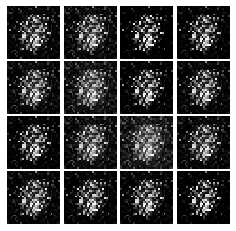

Epoch: 0, Iter: 400, D: 0.1009, G:0.682


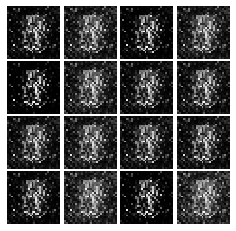

Epoch: 0, Iter: 420, D: 0.1023, G:0.4446


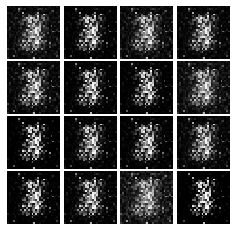

Epoch: 0, Iter: 440, D: 0.07296, G:0.4714


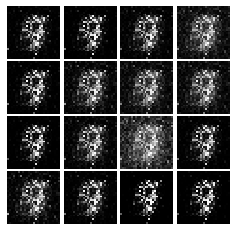

Epoch: 0, Iter: 460, D: 0.1423, G:0.1478


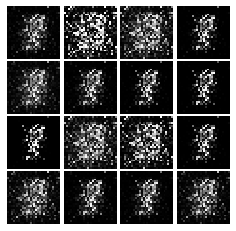

Epoch: 1, Iter: 480, D: 0.1229, G:0.4501


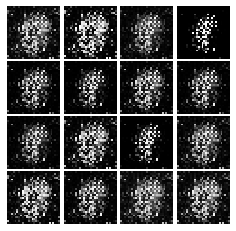

Epoch: 1, Iter: 500, D: 0.15, G:0.4374


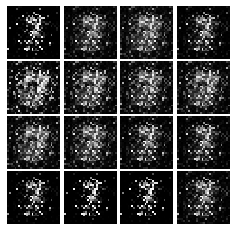

Epoch: 1, Iter: 520, D: 0.1756, G:0.5798


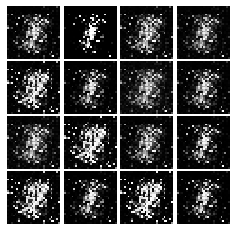

Epoch: 1, Iter: 540, D: 0.1644, G:0.4166


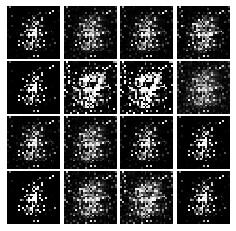

Epoch: 1, Iter: 560, D: 0.1424, G:0.3957


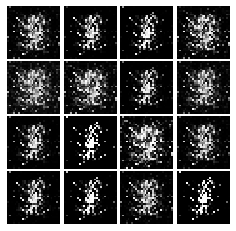

Epoch: 1, Iter: 580, D: 0.1719, G:0.3358


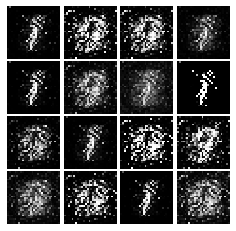

Epoch: 1, Iter: 600, D: 0.1636, G:0.3143


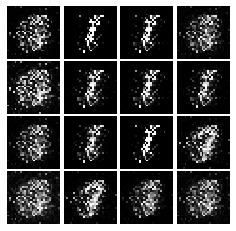

Epoch: 1, Iter: 620, D: 0.1201, G:0.3489


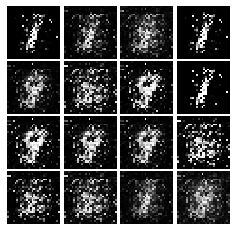

Epoch: 1, Iter: 640, D: 0.1392, G:0.3721


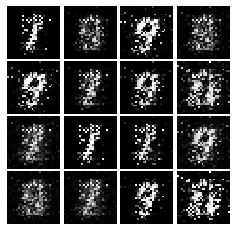

Epoch: 1, Iter: 660, D: 0.1178, G:0.3352


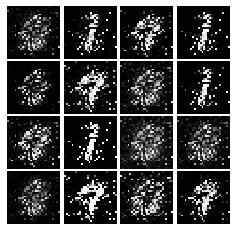

Epoch: 1, Iter: 680, D: 0.1442, G:0.3258


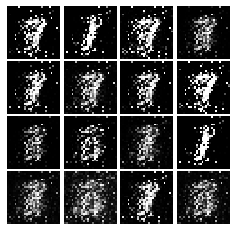

Epoch: 1, Iter: 700, D: 0.7501, G:0.7073


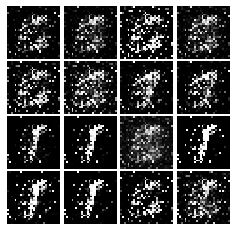

Epoch: 1, Iter: 720, D: 0.2026, G:0.372


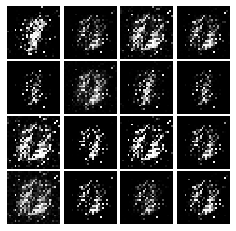

Epoch: 1, Iter: 740, D: 0.1068, G:0.2992


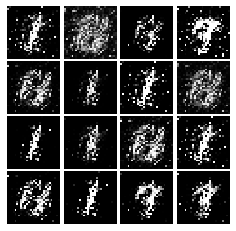

Epoch: 1, Iter: 760, D: 0.1315, G:0.3982


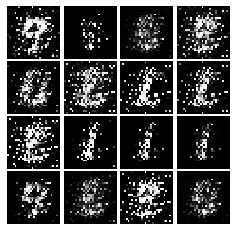

Epoch: 1, Iter: 780, D: 0.1215, G:1.521


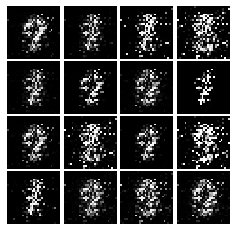

Epoch: 1, Iter: 800, D: 0.1685, G:0.2624


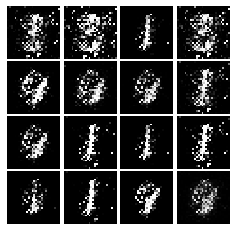

Epoch: 1, Iter: 820, D: 0.1004, G:0.4725


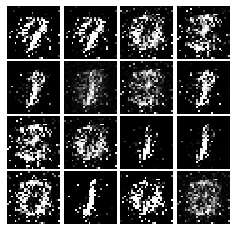

Epoch: 1, Iter: 840, D: 0.1015, G:0.3947


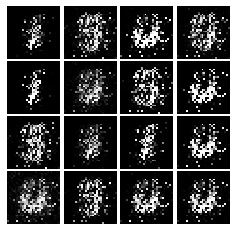

Epoch: 1, Iter: 860, D: 0.1368, G:0.6212


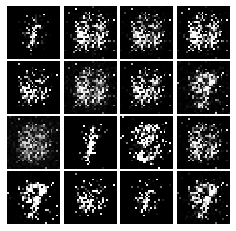

Epoch: 1, Iter: 880, D: 0.1406, G:0.2598


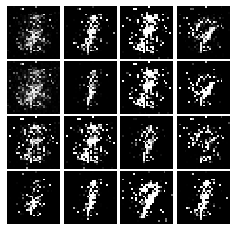

Epoch: 1, Iter: 900, D: 0.1451, G:0.4145


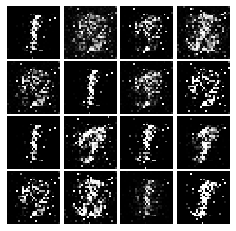

Epoch: 1, Iter: 920, D: 0.195, G:0.1905


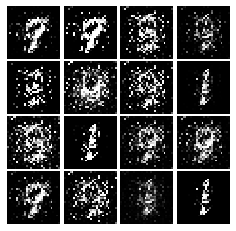

Epoch: 2, Iter: 940, D: 0.1259, G:0.3656


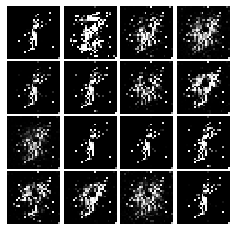

Epoch: 2, Iter: 960, D: 0.1797, G:0.2652


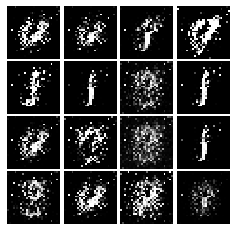

Epoch: 2, Iter: 980, D: 0.1111, G:0.3332


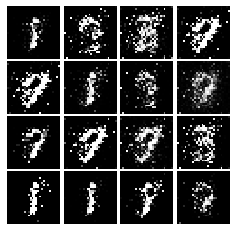

Epoch: 2, Iter: 1000, D: 0.1348, G:0.4752


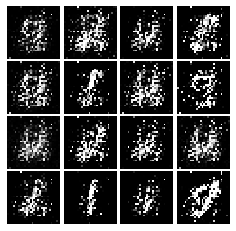

Epoch: 2, Iter: 1020, D: 0.3165, G:0.1575


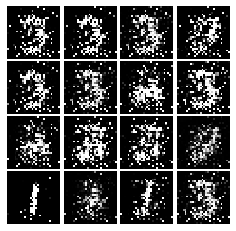

Epoch: 2, Iter: 1040, D: 0.1177, G:0.3917


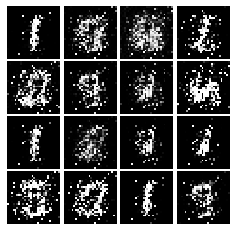

Epoch: 2, Iter: 1060, D: 0.08009, G:0.3493


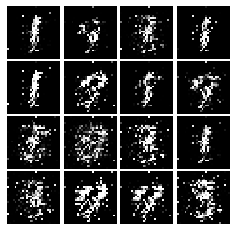

Epoch: 2, Iter: 1080, D: 0.1136, G:0.3799


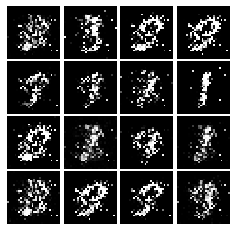

Epoch: 2, Iter: 1100, D: 0.1007, G:0.3484


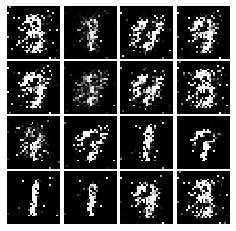

Epoch: 2, Iter: 1120, D: 0.1459, G:0.3327


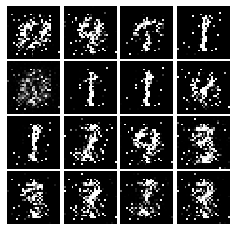

Epoch: 2, Iter: 1140, D: 0.123, G:0.3959


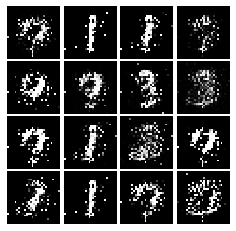

Epoch: 2, Iter: 1160, D: 0.3202, G:0.2915


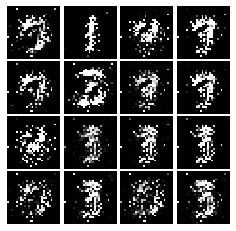

Epoch: 2, Iter: 1180, D: 0.1541, G:0.6149


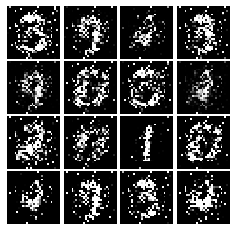

Epoch: 2, Iter: 1200, D: 0.1505, G:0.5859


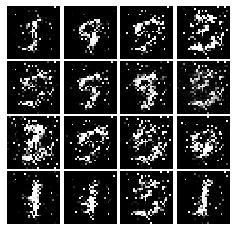

Epoch: 2, Iter: 1220, D: 0.09925, G:0.6336


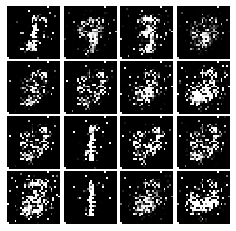

Epoch: 2, Iter: 1240, D: 0.1738, G:0.6182


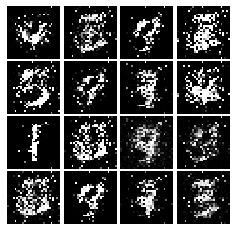

Epoch: 2, Iter: 1260, D: 0.04921, G:0.5321


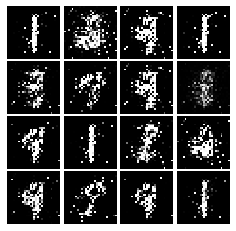

Epoch: 2, Iter: 1280, D: 0.1077, G:0.315


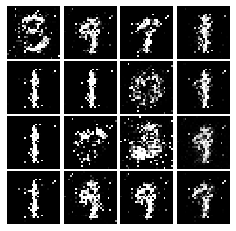

Epoch: 2, Iter: 1300, D: 0.1202, G:0.3956


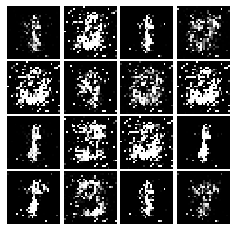

Epoch: 2, Iter: 1320, D: 0.1292, G:0.3202


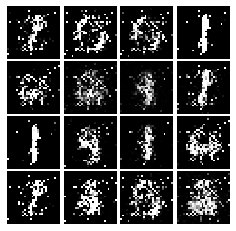

Epoch: 2, Iter: 1340, D: 0.1254, G:0.4339


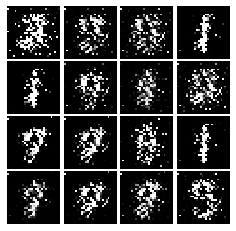

Epoch: 2, Iter: 1360, D: 0.1306, G:0.3424


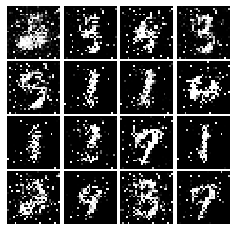

Epoch: 2, Iter: 1380, D: 0.09859, G:0.3797


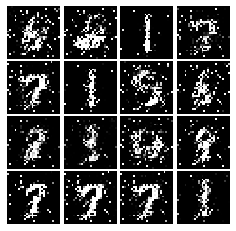

Epoch: 2, Iter: 1400, D: 0.1149, G:0.2631


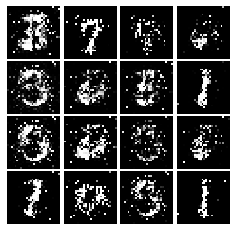

Epoch: 3, Iter: 1420, D: 0.1766, G:0.3073


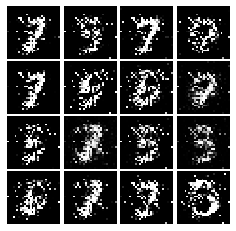

Epoch: 3, Iter: 1440, D: 0.1211, G:0.3178


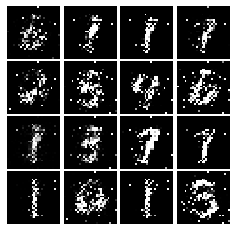

Epoch: 3, Iter: 1460, D: 0.1324, G:0.2666


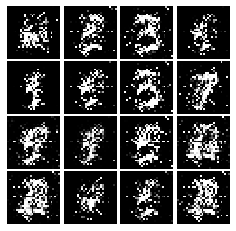

Epoch: 3, Iter: 1480, D: 0.5314, G:0.1146


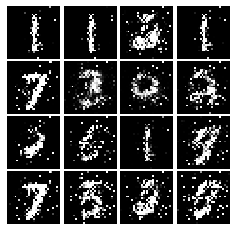

Epoch: 3, Iter: 1500, D: 0.1425, G:0.3613


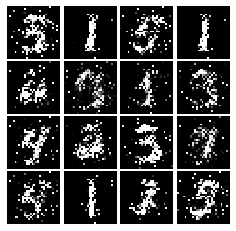

Epoch: 3, Iter: 1520, D: 0.1661, G:0.2582


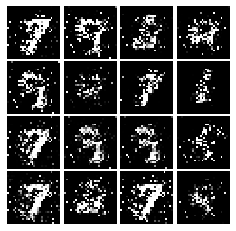

Epoch: 3, Iter: 1540, D: 0.1449, G:0.3451


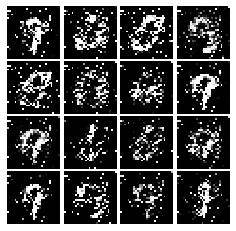

Epoch: 3, Iter: 1560, D: 0.1353, G:0.2527


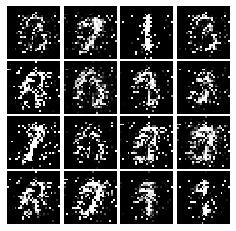

Epoch: 3, Iter: 1580, D: 0.1606, G:0.2813


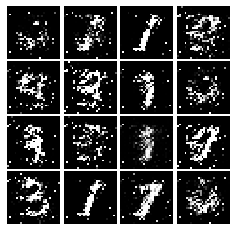

Epoch: 3, Iter: 1600, D: 0.1381, G:0.3602


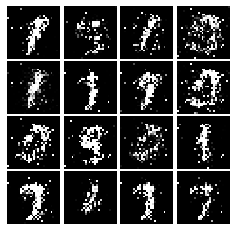

Epoch: 3, Iter: 1620, D: 0.1115, G:0.3522


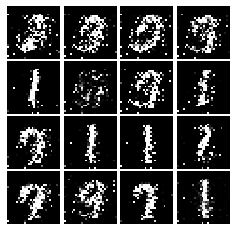

Epoch: 3, Iter: 1640, D: 0.353, G:0.4634


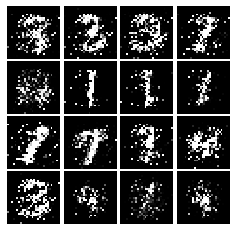

Epoch: 3, Iter: 1660, D: 0.1462, G:0.3927


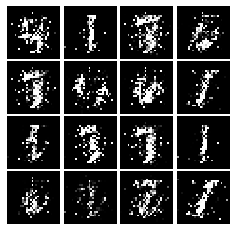

Epoch: 3, Iter: 1680, D: 0.1619, G:0.2845


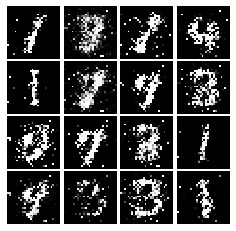

Epoch: 3, Iter: 1700, D: 0.1846, G:0.2848


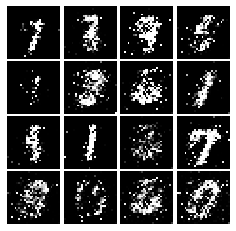

Epoch: 3, Iter: 1720, D: 0.1716, G:0.2829


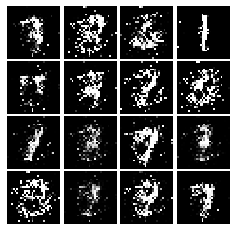

Epoch: 3, Iter: 1740, D: 0.1278, G:0.5135


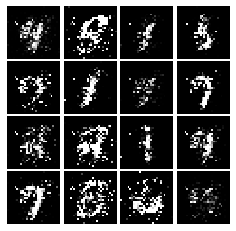

Epoch: 3, Iter: 1760, D: 0.1452, G:0.3964


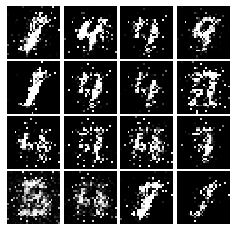

Epoch: 3, Iter: 1780, D: 0.1428, G:0.2681


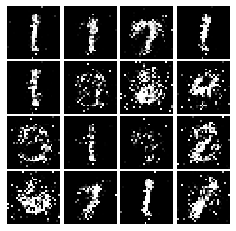

Epoch: 3, Iter: 1800, D: 0.1684, G:0.2637


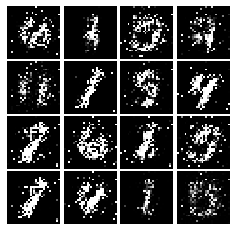

Epoch: 3, Iter: 1820, D: 0.1683, G:0.2771


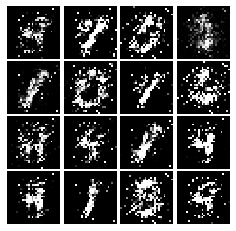

Epoch: 3, Iter: 1840, D: 0.1745, G:0.3051


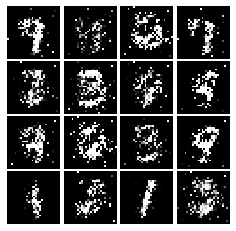

Epoch: 3, Iter: 1860, D: 0.1814, G:0.2815


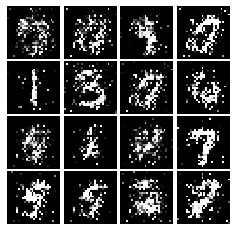

Epoch: 4, Iter: 1880, D: 0.1719, G:0.2497


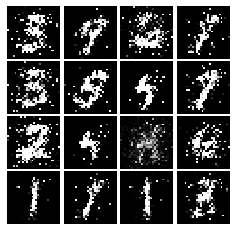

Epoch: 4, Iter: 1900, D: 0.1458, G:0.2614


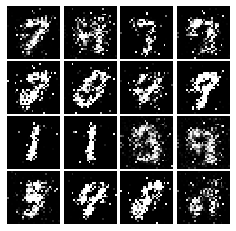

Epoch: 4, Iter: 1920, D: 0.1932, G:0.2602


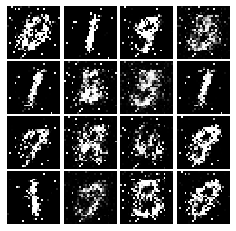

Epoch: 4, Iter: 1940, D: 0.1483, G:0.2779


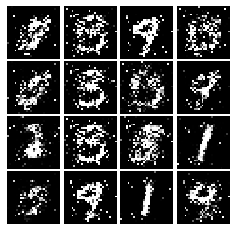

Epoch: 4, Iter: 1960, D: 0.1763, G:0.2875


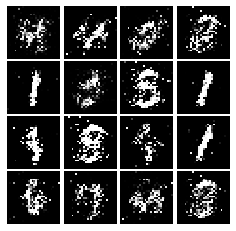

Epoch: 4, Iter: 1980, D: 0.1944, G:0.1818


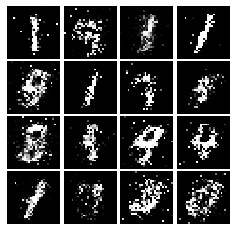

Epoch: 4, Iter: 2000, D: 0.2102, G:0.2487


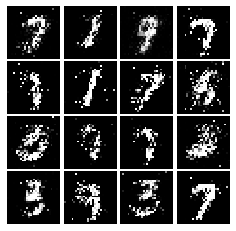

Epoch: 4, Iter: 2020, D: 0.1924, G:0.173


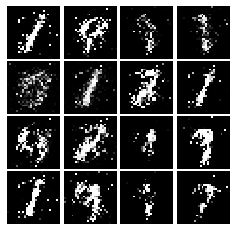

Epoch: 4, Iter: 2040, D: 0.1948, G:0.245


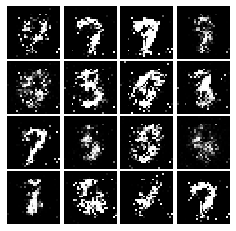

Epoch: 4, Iter: 2060, D: 0.2163, G:0.2259


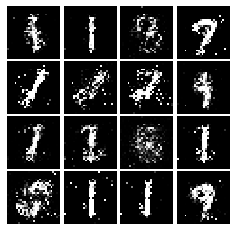

Epoch: 4, Iter: 2080, D: 0.2134, G:0.2168


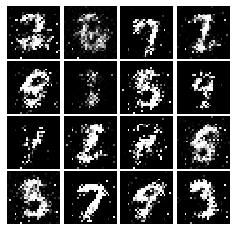

Epoch: 4, Iter: 2100, D: 0.2128, G:0.2223


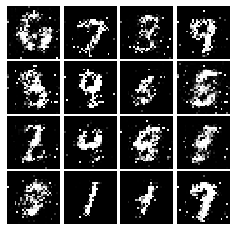

Epoch: 4, Iter: 2120, D: 0.2181, G:0.1911


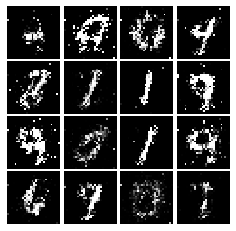

Epoch: 4, Iter: 2140, D: 0.2076, G:0.2269


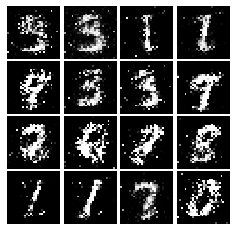

Epoch: 4, Iter: 2160, D: 0.2233, G:0.1972


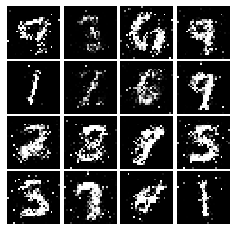

Epoch: 4, Iter: 2180, D: 0.1922, G:0.2181


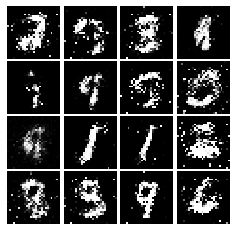

Epoch: 4, Iter: 2200, D: 0.2073, G:0.2304


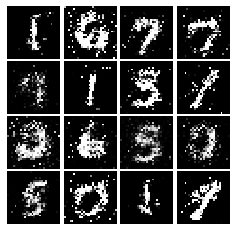

Epoch: 4, Iter: 2220, D: 0.1896, G:0.3606


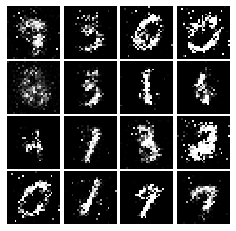

Epoch: 4, Iter: 2240, D: 0.2084, G:0.1793


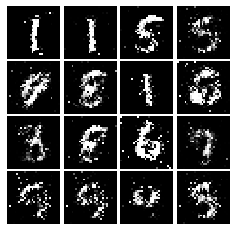

Epoch: 4, Iter: 2260, D: 0.2228, G:0.2152


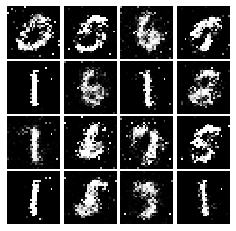

Epoch: 4, Iter: 2280, D: 0.2251, G:0.2465


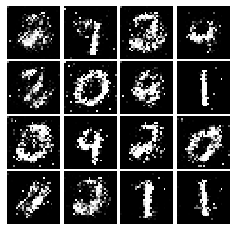

Epoch: 4, Iter: 2300, D: 0.1935, G:0.2485


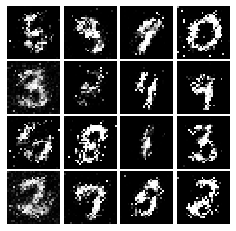

Epoch: 4, Iter: 2320, D: 0.2111, G:0.1938


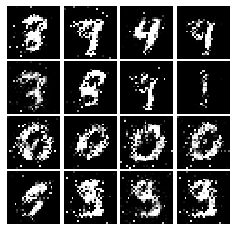

Epoch: 4, Iter: 2340, D: 0.1935, G:0.216


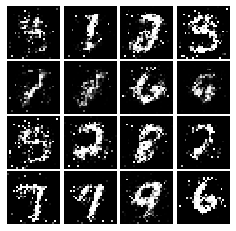

Epoch: 5, Iter: 2360, D: 0.2103, G:0.1742


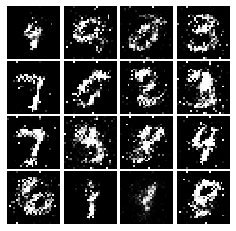

Epoch: 5, Iter: 2380, D: 0.1912, G:0.2017


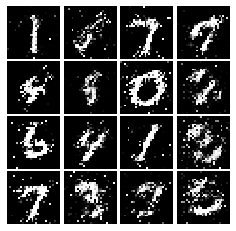

Epoch: 5, Iter: 2400, D: 0.2195, G:0.2124


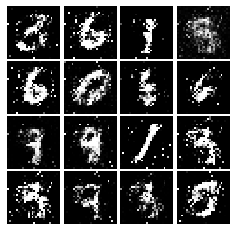

Epoch: 5, Iter: 2420, D: 0.1973, G:0.2735


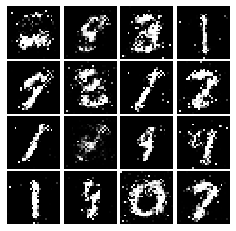

Epoch: 5, Iter: 2440, D: 0.1986, G:0.1735


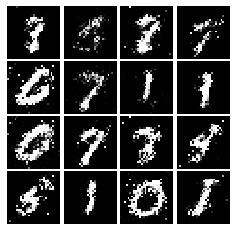

Epoch: 5, Iter: 2460, D: 0.1727, G:0.2345


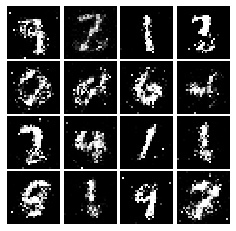

Epoch: 5, Iter: 2480, D: 0.2118, G:0.1723


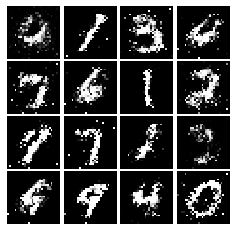

Epoch: 5, Iter: 2500, D: 0.1997, G:0.2411


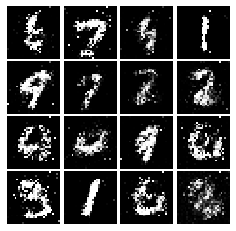

Epoch: 5, Iter: 2520, D: 0.2537, G:0.2085


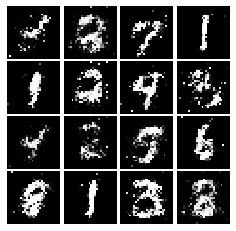

Epoch: 5, Iter: 2540, D: 0.2386, G:0.1699


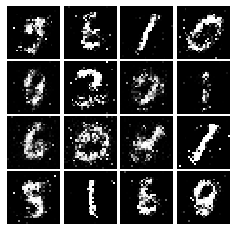

Epoch: 5, Iter: 2560, D: 0.2405, G:0.1716


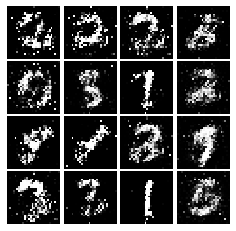

Epoch: 5, Iter: 2580, D: 0.2129, G:0.1872


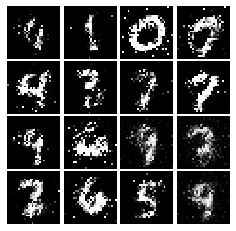

Epoch: 5, Iter: 2600, D: 0.2551, G:0.1382


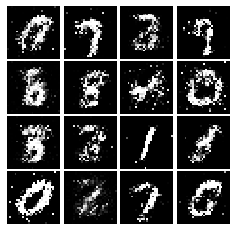

Epoch: 5, Iter: 2620, D: 0.2208, G:0.183


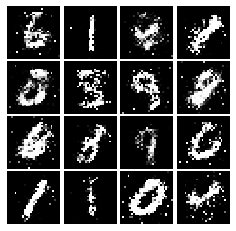

Epoch: 5, Iter: 2640, D: 0.2064, G:0.1961


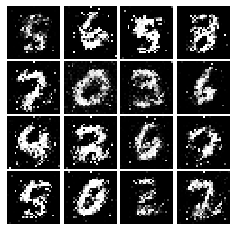

Epoch: 5, Iter: 2660, D: 0.1954, G:0.1867


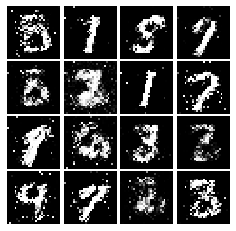

Epoch: 5, Iter: 2680, D: 0.2295, G:0.226


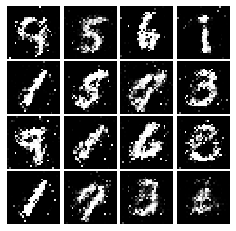

Epoch: 5, Iter: 2700, D: 0.2027, G:0.1953


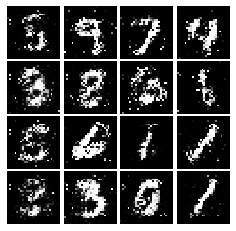

Epoch: 5, Iter: 2720, D: 0.2121, G:0.1864


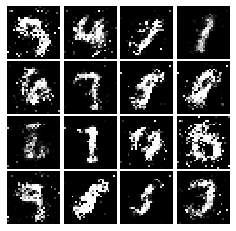

Epoch: 5, Iter: 2740, D: 0.1778, G:0.1983


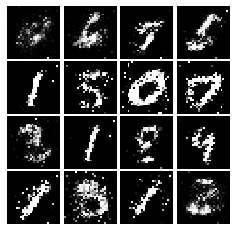

Epoch: 5, Iter: 2760, D: 0.2415, G:0.1635


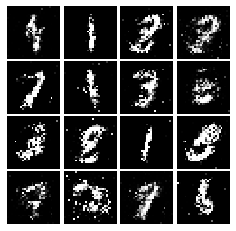

Epoch: 5, Iter: 2780, D: 0.218, G:0.1876


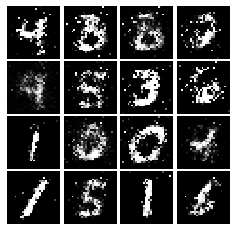

Epoch: 5, Iter: 2800, D: 0.2033, G:0.1974


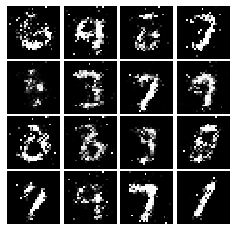

KeyboardInterrupt: 

In [63]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [75]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer((784,)),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32, (5,5),1,'VALID'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2,2),
        tf.keras.layers.Conv2D(64, (5,5),1,'VALID'),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.MaxPool2D(2,2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(alpha=0.01),
        tf.keras.layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [107]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    tf.keras.layers.InputLayer((noise_dim,)),
    tf.keras.layers.Dense(1024),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dense(7*7*128),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Reshape((7,7,128)),
    tf.keras.layers.Conv2DTranspose(64,(4,4),2,padding='same'),
    tf.keras.layers.ReLU(),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2DTranspose(1,(4,4),2,padding='same'),
    tf.keras.layers.Activation("tanh")
    ])
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.423, G:0.6569


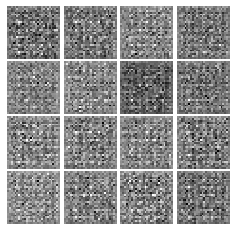

Epoch: 0, Iter: 20, D: 0.5466, G:1.309


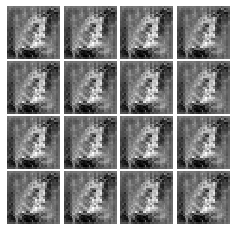

Epoch: 0, Iter: 40, D: 0.2923, G:2.585


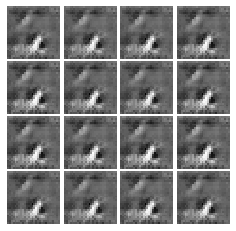

Epoch: 0, Iter: 60, D: 1.893, G:1.755


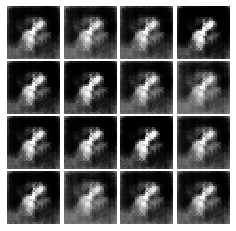

Epoch: 0, Iter: 80, D: 0.2024, G:3.472


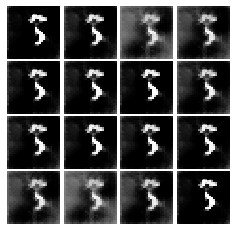

Epoch: 0, Iter: 100, D: 0.8035, G:2.86


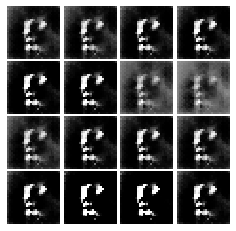

Epoch: 0, Iter: 120, D: 0.9955, G:3.243


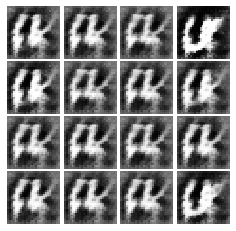

Epoch: 0, Iter: 140, D: 0.282, G:2.284


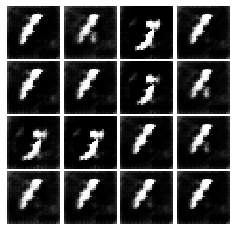

Epoch: 0, Iter: 160, D: 0.447, G:2.568


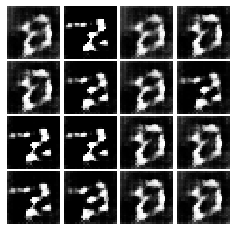

Epoch: 0, Iter: 180, D: 0.5677, G:2.753


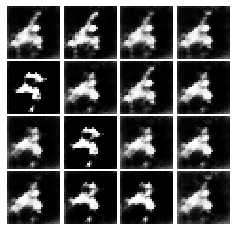

Epoch: 0, Iter: 200, D: 0.618, G:2.801


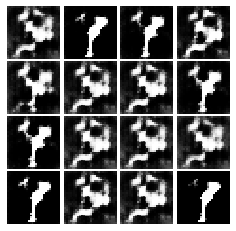

Epoch: 0, Iter: 220, D: 1.237, G:2.716


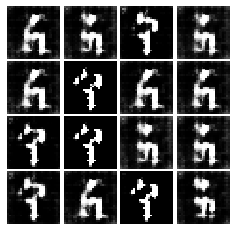

Epoch: 0, Iter: 240, D: 0.3196, G:2.676


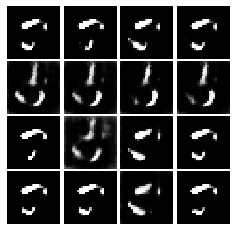

Epoch: 0, Iter: 260, D: 1.2, G:2.027


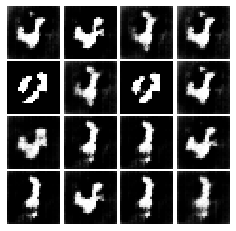

Epoch: 0, Iter: 280, D: 0.9121, G:3.164


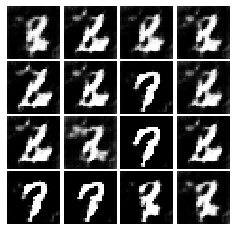

Epoch: 0, Iter: 300, D: 0.5007, G:2.806


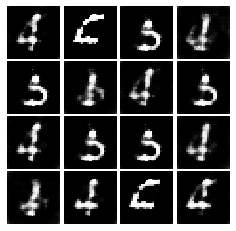

Epoch: 0, Iter: 320, D: 0.9234, G:4.146


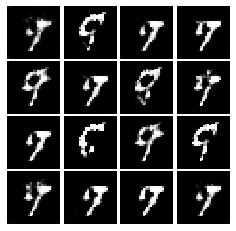

Epoch: 0, Iter: 340, D: 1.407, G:0.9182


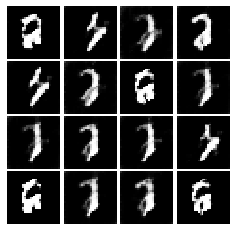

Epoch: 0, Iter: 360, D: 0.7007, G:2.249


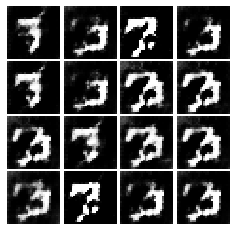

Epoch: 0, Iter: 380, D: 1.438, G:3.903


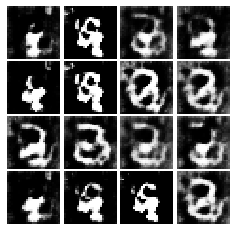

Epoch: 0, Iter: 400, D: 1.111, G:4.567


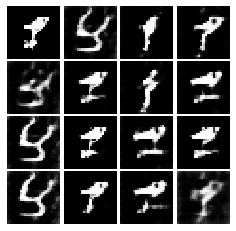

Epoch: 0, Iter: 420, D: 0.6643, G:2.124


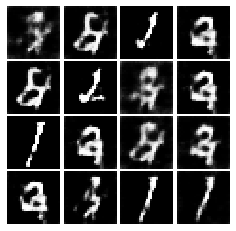

Epoch: 0, Iter: 440, D: 0.37, G:3.938


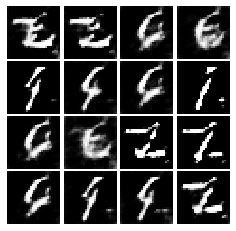

Epoch: 0, Iter: 460, D: 0.3572, G:3.348


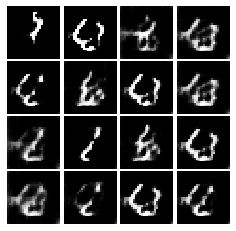

Epoch: 1, Iter: 480, D: 0.9398, G:3.49


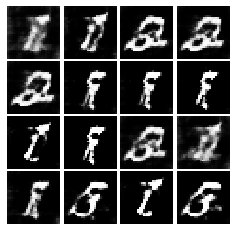

Epoch: 1, Iter: 500, D: 0.6102, G:2.859


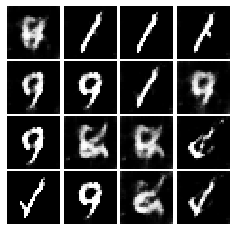

Epoch: 1, Iter: 520, D: 0.6396, G:1.428


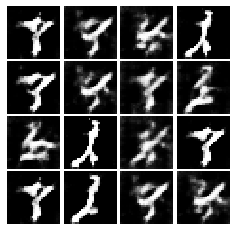

Epoch: 1, Iter: 540, D: 0.3354, G:3.054


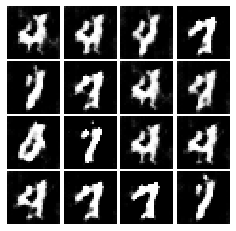

Epoch: 1, Iter: 560, D: 0.5008, G:2.624


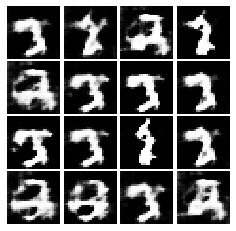

Epoch: 1, Iter: 580, D: 0.5294, G:2.66


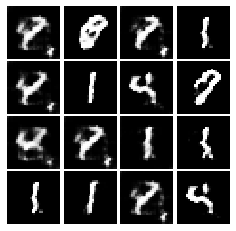

Epoch: 1, Iter: 600, D: 0.4964, G:2.942


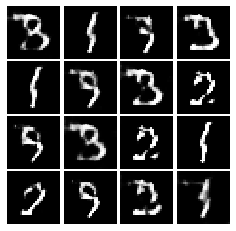

Epoch: 1, Iter: 620, D: 0.638, G:3.603


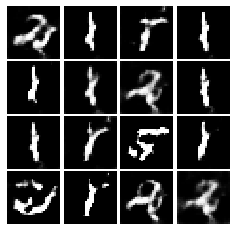

Epoch: 1, Iter: 640, D: 0.4966, G:4.078


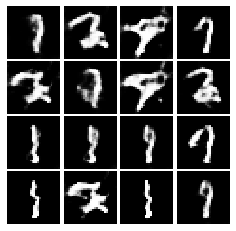

Epoch: 1, Iter: 660, D: 0.4834, G:2.25


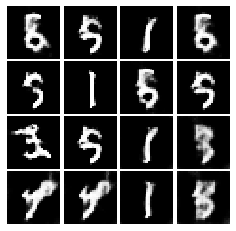

Epoch: 1, Iter: 680, D: 0.4742, G:1.843


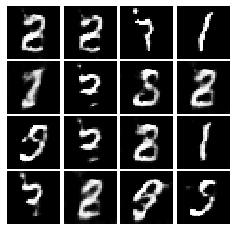

Epoch: 1, Iter: 700, D: 0.5118, G:3.885


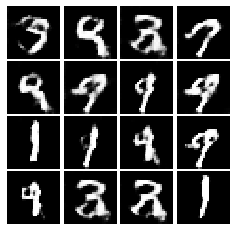

Epoch: 1, Iter: 720, D: 0.8787, G:4.142


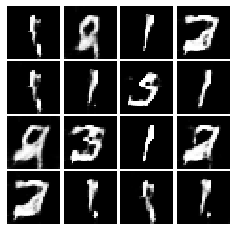

Epoch: 1, Iter: 740, D: 0.6703, G:1.538


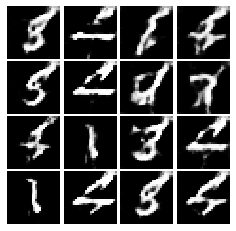

Epoch: 1, Iter: 760, D: 0.4412, G:3.228


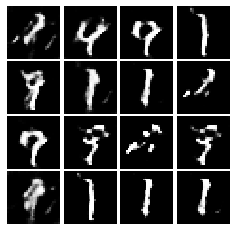

Epoch: 1, Iter: 780, D: 0.6913, G:2.727


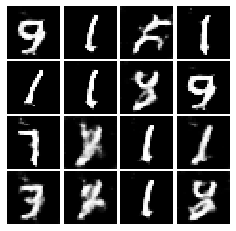

Epoch: 1, Iter: 800, D: 0.8337, G:1.474


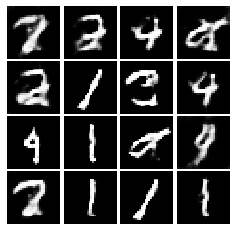

Epoch: 1, Iter: 820, D: 0.9269, G:1.824


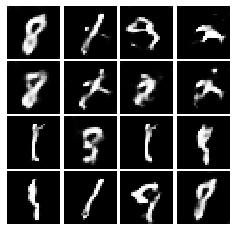

Epoch: 1, Iter: 840, D: 0.7268, G:1.901


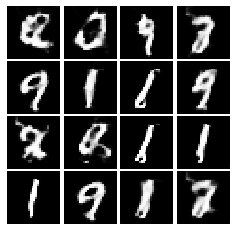

Epoch: 1, Iter: 860, D: 0.6999, G:2.017


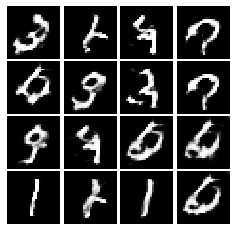

Epoch: 1, Iter: 880, D: 0.4629, G:2.474


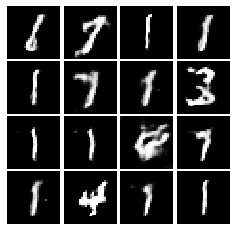

Epoch: 1, Iter: 900, D: 1.368, G:3.159


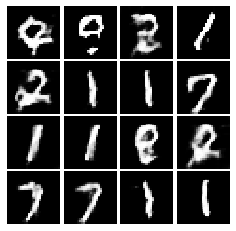

Epoch: 1, Iter: 920, D: 0.7118, G:2.126


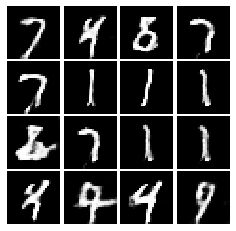

Epoch: 2, Iter: 940, D: 0.7689, G:1.708


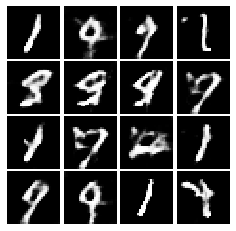

Epoch: 2, Iter: 960, D: 0.8511, G:2.217


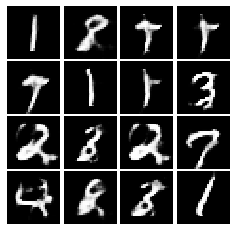

Epoch: 2, Iter: 980, D: 0.7993, G:1.357


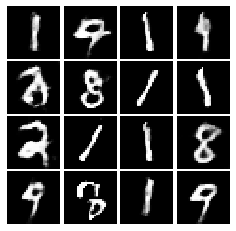

Epoch: 2, Iter: 1000, D: 0.6104, G:1.872


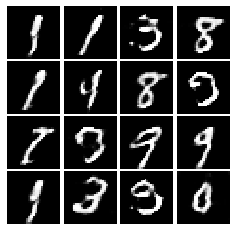

Epoch: 2, Iter: 1020, D: 0.6879, G:1.879


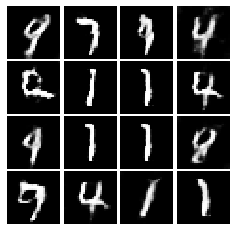

Epoch: 2, Iter: 1040, D: 0.7863, G:1.45


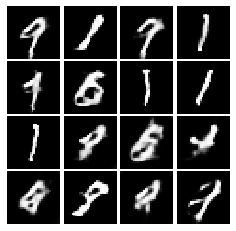

Epoch: 2, Iter: 1060, D: 0.7007, G:2.813


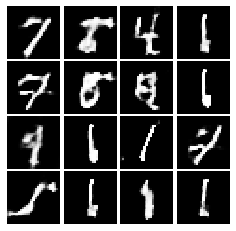

Epoch: 2, Iter: 1080, D: 0.6502, G:1.499


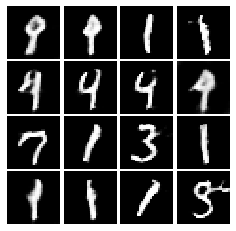

Epoch: 2, Iter: 1100, D: 0.4332, G:1.962


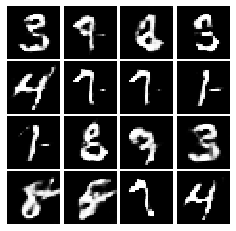

Epoch: 2, Iter: 1120, D: 0.7455, G:1.851


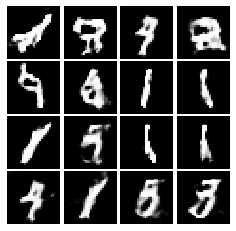

Epoch: 2, Iter: 1140, D: 0.7246, G:2.064


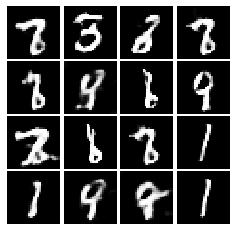

Epoch: 2, Iter: 1160, D: 0.6355, G:1.673


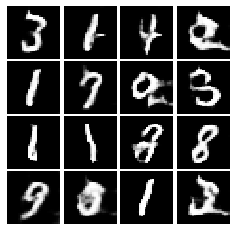

Epoch: 2, Iter: 1180, D: 0.7824, G:1.385


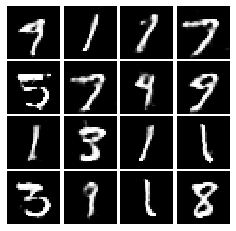

Epoch: 2, Iter: 1200, D: 0.7193, G:1.469


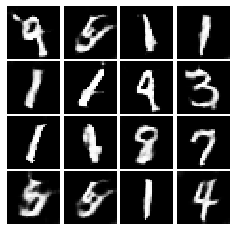

Epoch: 2, Iter: 1220, D: 0.7397, G:1.457


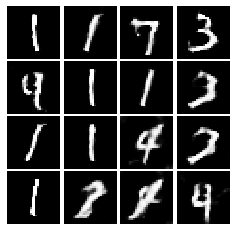

Epoch: 2, Iter: 1240, D: 0.7109, G:1.399


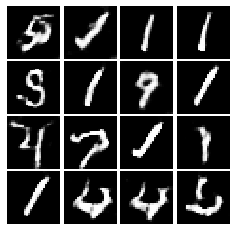

Epoch: 2, Iter: 1260, D: 0.6098, G:1.632


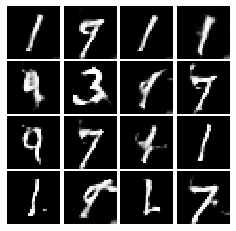

Epoch: 2, Iter: 1280, D: 0.8382, G:2.072


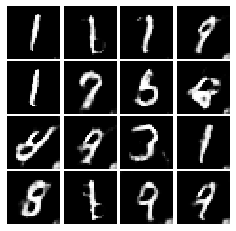

Epoch: 2, Iter: 1300, D: 0.7723, G:1.634


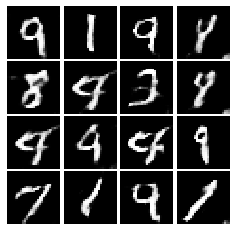

Epoch: 2, Iter: 1320, D: 0.9346, G:1.341


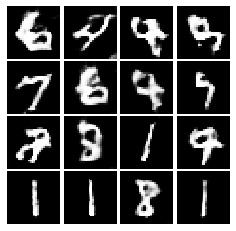

Epoch: 2, Iter: 1340, D: 0.9531, G:1.156


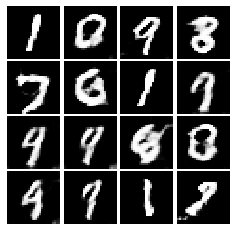

Epoch: 2, Iter: 1360, D: 0.6036, G:1.886


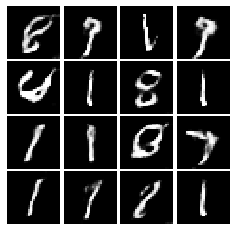

Epoch: 2, Iter: 1380, D: 0.7312, G:1.433


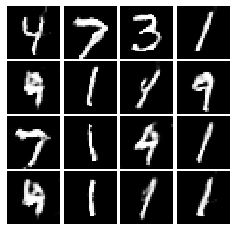

Epoch: 2, Iter: 1400, D: 0.7909, G:1.831


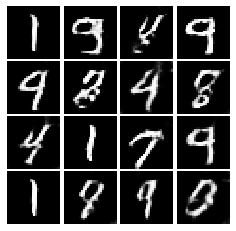

Epoch: 3, Iter: 1420, D: 0.8214, G:1.678


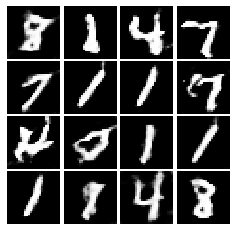

Epoch: 3, Iter: 1440, D: 0.7196, G:1.455


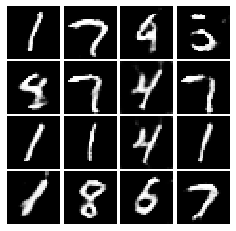

Epoch: 3, Iter: 1460, D: 0.7992, G:1.652


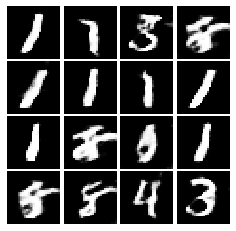

Epoch: 3, Iter: 1480, D: 0.8598, G:2.029


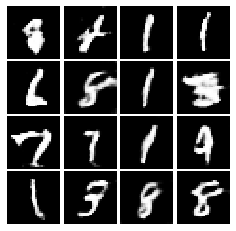

Epoch: 3, Iter: 1500, D: 0.7859, G:1.164


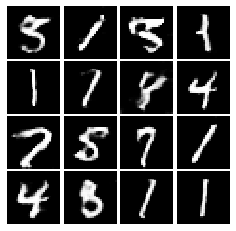

Epoch: 3, Iter: 1520, D: 0.6363, G:1.341


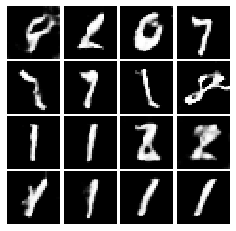

Epoch: 3, Iter: 1540, D: 0.7378, G:2.171


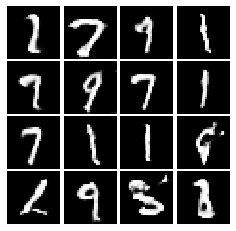

Epoch: 3, Iter: 1560, D: 0.8472, G:1.195


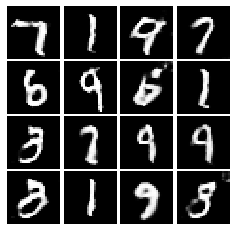

Epoch: 3, Iter: 1580, D: 0.9055, G:1.485


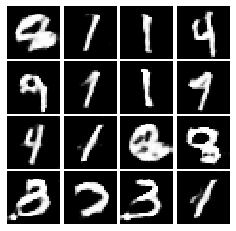

Epoch: 3, Iter: 1600, D: 0.919, G:1.48


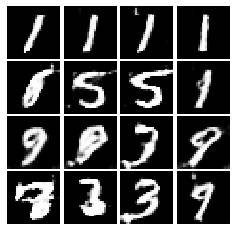

Epoch: 3, Iter: 1620, D: 0.8038, G:1.748


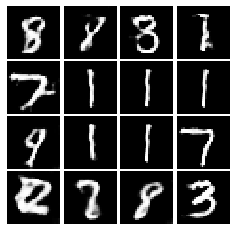

Epoch: 3, Iter: 1640, D: 0.7043, G:1.59


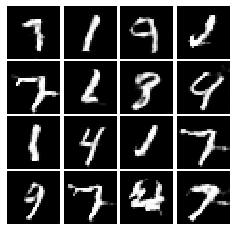

Epoch: 3, Iter: 1660, D: 0.8035, G:1.443


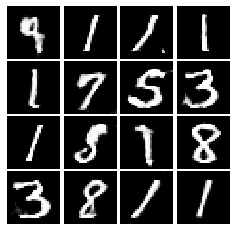

Epoch: 3, Iter: 1680, D: 0.7234, G:1.64


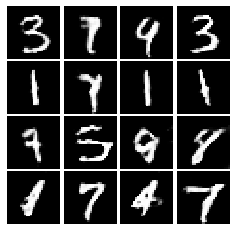

Epoch: 3, Iter: 1700, D: 0.6404, G:2.282


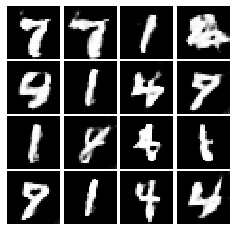

Epoch: 3, Iter: 1720, D: 0.739, G:1.457


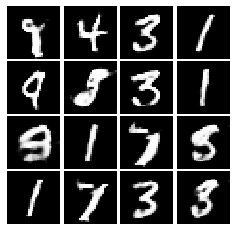

Epoch: 3, Iter: 1740, D: 0.8229, G:1.488


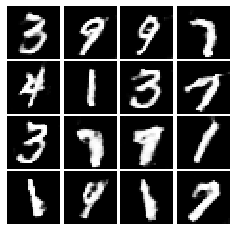

Epoch: 3, Iter: 1760, D: 0.7002, G:2.022


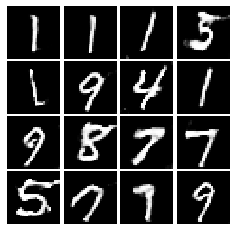

Epoch: 3, Iter: 1780, D: 0.7338, G:1.916


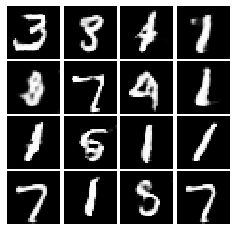

Epoch: 3, Iter: 1800, D: 0.9501, G:1.34


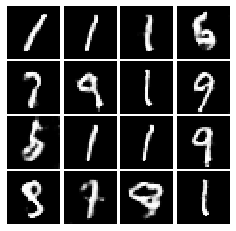

Epoch: 3, Iter: 1820, D: 0.8091, G:1.214


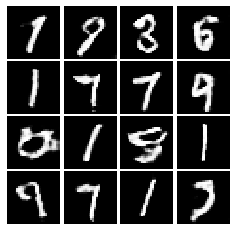

Epoch: 3, Iter: 1840, D: 0.7493, G:1.329


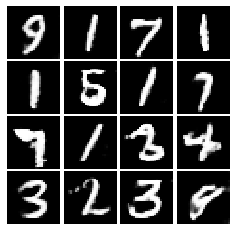

Epoch: 3, Iter: 1860, D: 0.8559, G:1.469


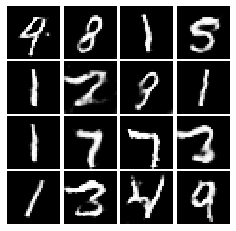

Epoch: 4, Iter: 1880, D: 0.7493, G:1.493


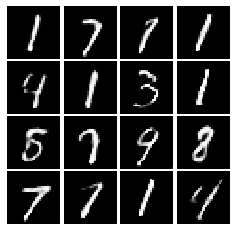

Epoch: 4, Iter: 1900, D: 0.7326, G:1.33


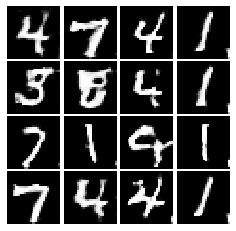

Epoch: 4, Iter: 1920, D: 0.6923, G:1.356


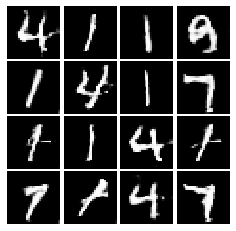

Epoch: 4, Iter: 1940, D: 0.8869, G:2.356


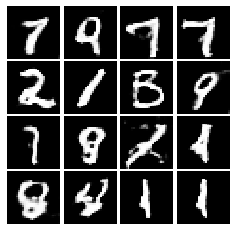

Epoch: 4, Iter: 1960, D: 0.8755, G:1.192


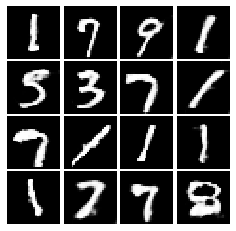

Epoch: 4, Iter: 1980, D: 0.6715, G:1.717


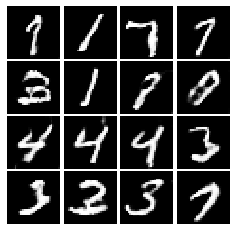

Epoch: 4, Iter: 2000, D: 0.9135, G:1.296


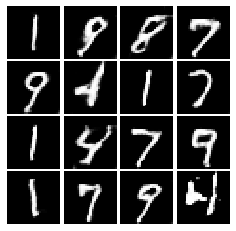

Epoch: 4, Iter: 2020, D: 0.7437, G:1.453


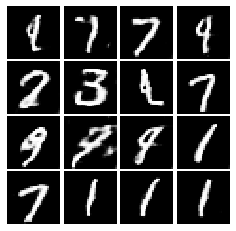

Epoch: 4, Iter: 2040, D: 0.8174, G:1.573


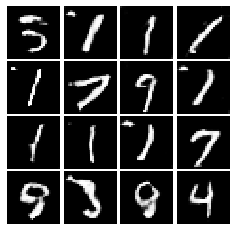

Epoch: 4, Iter: 2060, D: 0.7191, G:1.827


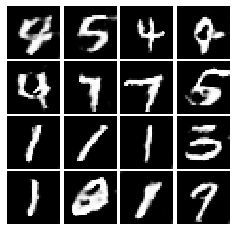

Epoch: 4, Iter: 2080, D: 1.082, G:2.542


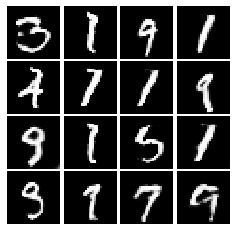

Epoch: 4, Iter: 2100, D: 0.9413, G:1.411


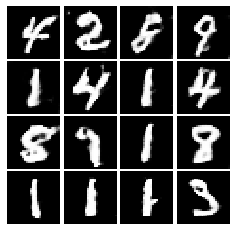

Epoch: 4, Iter: 2120, D: 0.8171, G:1.199


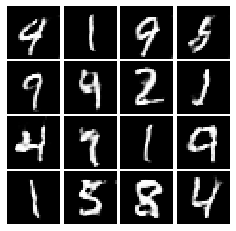

Epoch: 4, Iter: 2140, D: 1.005, G:1.721


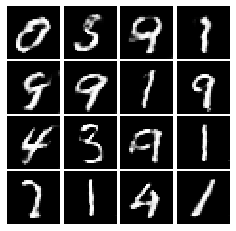

Epoch: 4, Iter: 2160, D: 0.8731, G:1.272


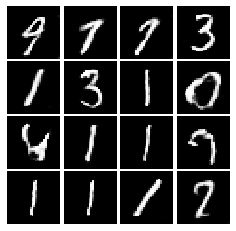

Epoch: 4, Iter: 2180, D: 0.7716, G:1.529


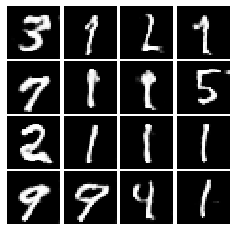

Epoch: 4, Iter: 2200, D: 1.132, G:1.467


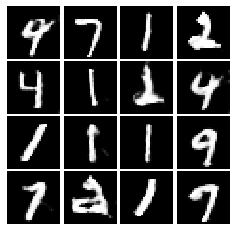

Epoch: 4, Iter: 2220, D: 0.8993, G:1.836


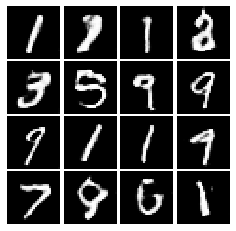

Epoch: 4, Iter: 2240, D: 0.8262, G:1.643


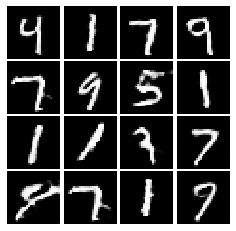

Epoch: 4, Iter: 2260, D: 0.8595, G:1.378


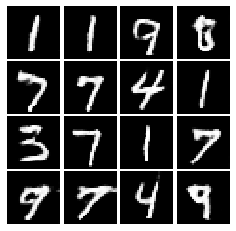

Epoch: 4, Iter: 2280, D: 0.7559, G:1.524


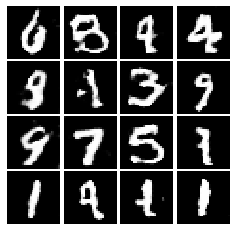

Epoch: 4, Iter: 2300, D: 0.8712, G:2.216


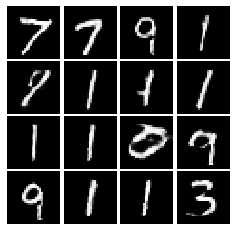

Epoch: 4, Iter: 2320, D: 0.7923, G:1.975


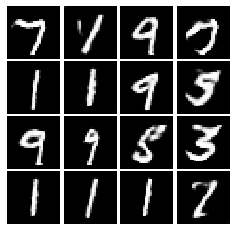

Epoch: 4, Iter: 2340, D: 0.9426, G:1.785


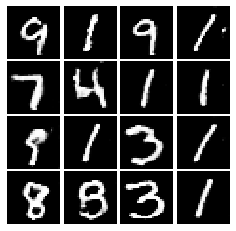

Final images


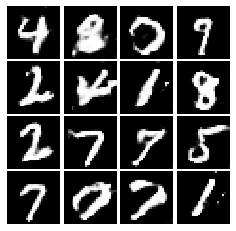

In [108]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |   2   |   1   |  -1   |   -2  |   -1  |   1    
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |   -1  |  -2   |  -1   |   1   |   2   |   1   
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer:  
We wont because it will stuck in a loop


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
It's not good beacause the discriminator is not learning, and it can misclassify true images with fake, meaning it can label fake image as true, then generetor loss will deacrease, thinking that it's producing real images.